<h3>In this notebook, I want to share with you one of my favorite Python libraries - sktime. As the package name suggests, sktime is basically scikit-learn with some nice time series components. This will be inspired by their walkthrough linked below.</h3>

https://www.sktime.org/en/stable/examples/01_forecasting.html

<span style='background-image: url("https://storage.googleapis.com/kaggle-media/competitions/Tabular%20Playground/aron-visuals-BXOXnQ26B7o-unsplash.jpg");'>
    <p style='font-size:25px;text-align: center;font-weight:bolder;'>TPS September 2022</p>   </span>
<!-- background-image: url("http://www.example.com/bck.png"); -->
<ol>
    <li>Install Sktime</li>
    <li>Load Libraries</li>
    <li>Load Data</li>
    <li>Exploratory Data Analysis</li>
    <li>Starting Simple: One Product, Naive Forecast</li>
    <li>Repeating the Process for All 48 Product Combinations</li>
    <li>Submission</li>
</ol>


## Install Sktime

In [1]:
!pip install sktime --root-user-action=ignore
!pip install pmdarima
!pip install lightgbm

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 6.9/6.9 MB 321.9 kB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 6.9/6.9 MB 321.9 kB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 572.0/572.0 kB 1.7 MB/s eta 0:00:00
Defaulting to user installation because normal site-packages is not writeable
     -------------------------------------- 572.0/572.0 kB 1.7 MB/s eta 0:00:00


## Load Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import sklearn as sklearn
import sktime

from sktime.forecasting.naive import NaiveForecaster
from sktime.forecasting.compose import TransformedTargetForecaster, make_reduction
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sktime.transformations.series.impute import Imputer
from sktime.forecasting.base import ForecastingHorizon
from sklearn.preprocessing import PowerTransformer, StandardScaler, MinMaxScaler, RobustScaler
from sktime.transformations.series.detrend import Deseasonalizer, ConditionalDeseasonalizer, Detrender
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.trend import PolynomialTrendForecaster
from sklearn.ensemble import GradientBoostingRegressor
from sktime.utils.plotting import plot_series

from sktime.forecasting.compose import ForecastingPipeline
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError

from statsmodels.tsa.deterministic import CalendarFourier

from lightgbm import LGBMRegressor
from sktime.forecasting.model_selection import ForecastingRandomizedSearchCV, ExpandingWindowSplitter

## Load Data

In [3]:
train = pd.read_csv(r"\Users\Slmss\Desktop\Tabular\train.csv")
test = pd.read_csv(r"\Users\Slmss\Desktop\Tabular\test.csv")

## Exploratory Data Analysis

In [5]:
train.head()

,row_id,date,country,store,product,num_sold
0,0,2017-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,663
1,1,2017-01-01,Belgium,KaggleMart,Kaggle Getting Started,615
2,2,2017-01-01,Belgium,KaggleMart,Kaggle Recipe Book,480
3,3,2017-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,710
4,4,2017-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,240


,row_id,date,country,store,product,num_sold
0,0,2017-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,663
1,1,2017-01-01,Belgium,KaggleMart,Kaggle Getting Started,615
2,2,2017-01-01,Belgium,KaggleMart,Kaggle Recipe Book,480
3,3,2017-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,710
4,4,2017-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,240


In [6]:
test.head()

,row_id,date,country,store,product
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques


,row_id,date,country,store,product
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques


In [7]:
test.shape

(17520, 5)

(17520, 5)

In [8]:
train['date'] = pd.to_datetime(train['date'])
test['date'] = pd.to_datetime(test['date'])

In [9]:
train.set_index('row_id', inplace=True)
test.set_index('row_id', inplace=True)

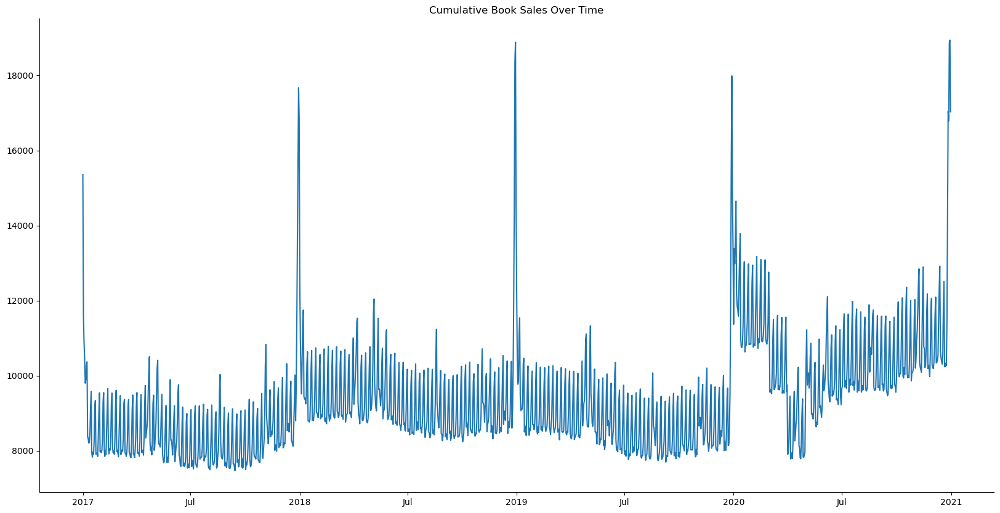

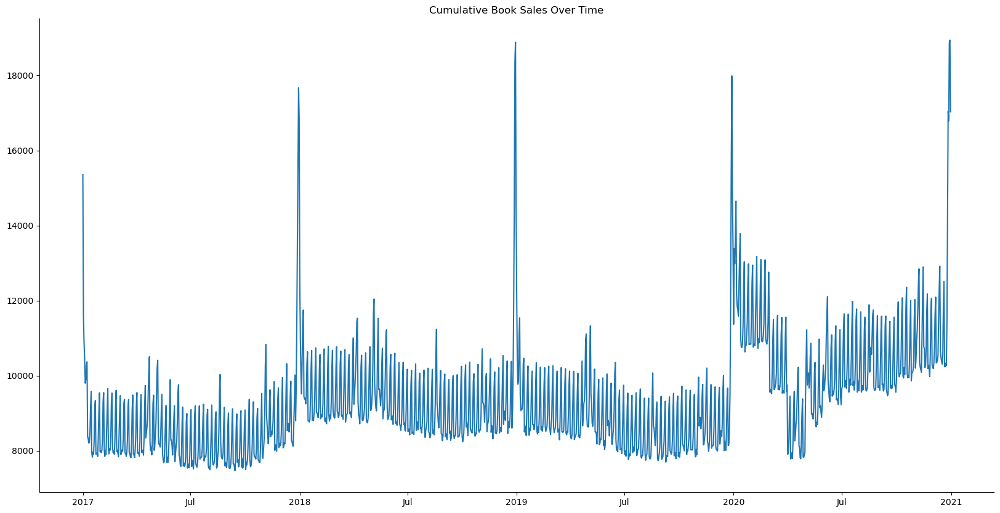

In [10]:
f, ax = plt.subplots(figsize=(20, 10))

ax.plot(train.groupby(['date']).sum())
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
ax.set_title('Cumulative Book Sales Over Time')
sns.despine()
plt.show()

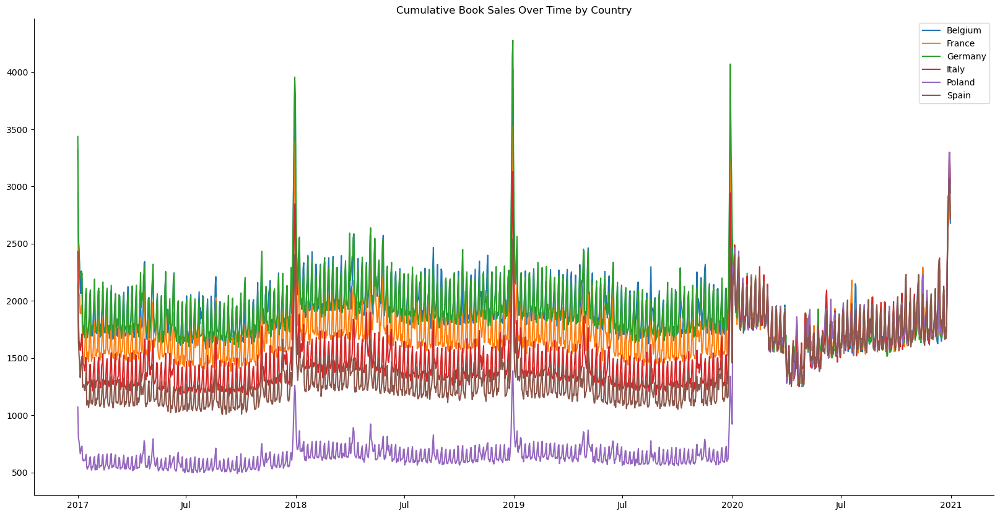

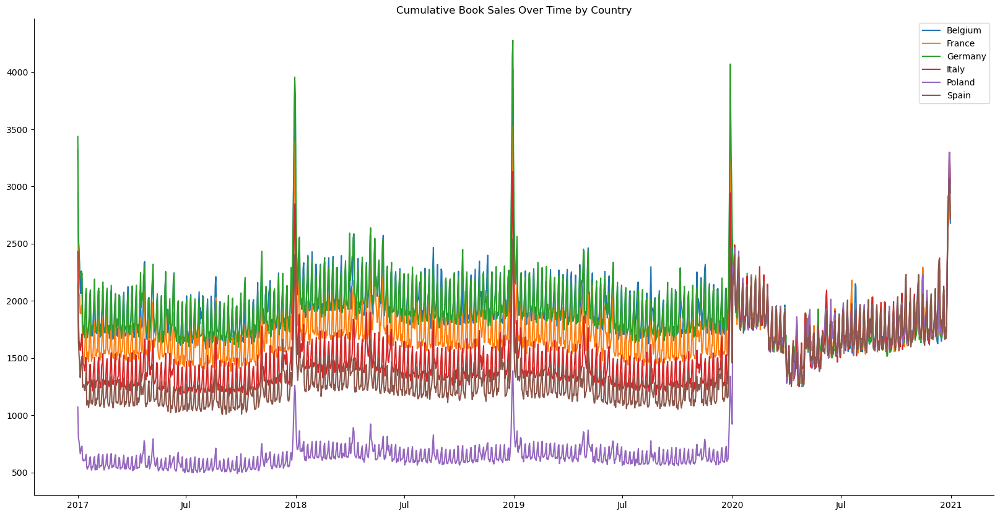

In [11]:
# Sales by date, country over time

f, ax = plt.subplots(figsize=(20, 10))
bycountry = train.groupby(['date', 'country']).sum().unstack()
labels = bycountry.columns
ax.plot(bycountry)

locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
ax.set_title('Cumulative Book Sales Over Time by Country')
sns.despine()
plt.legend(bycountry['num_sold'].columns)
plt.show()

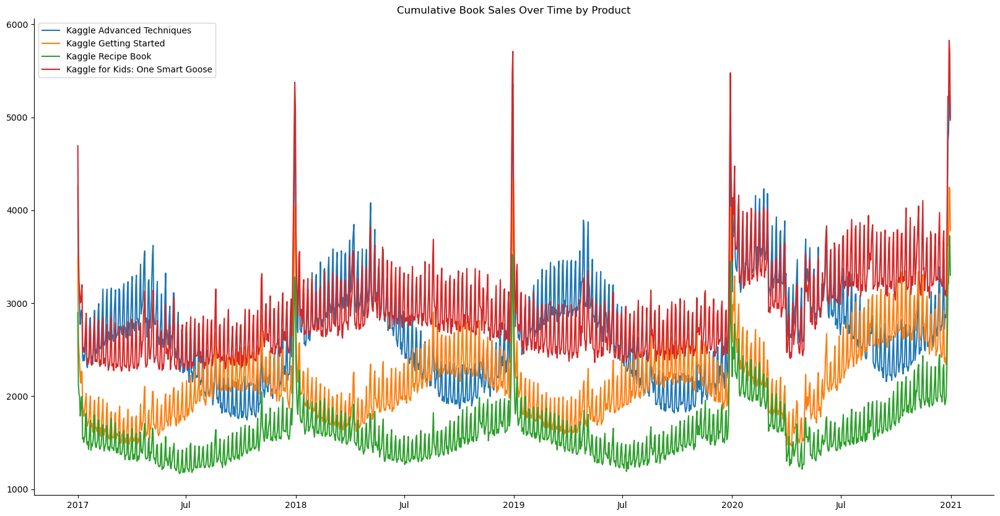

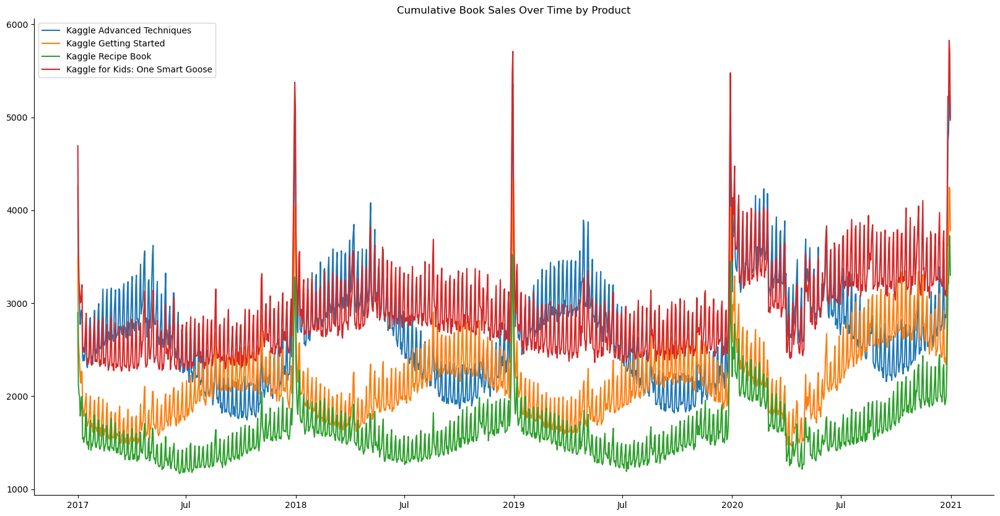

In [12]:
# Sales by date, store over time

f, ax = plt.subplots(figsize=(20, 10))
bycountry = train.groupby(['date', 'product']).sum().unstack()
labels = bycountry.columns
ax.plot(bycountry)

locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
ax.set_title('Cumulative Book Sales Over Time by Product')
sns.despine()
plt.legend(bycountry['num_sold'].columns)
plt.show()

## Starting Simple: One Product, Naive Forecaster

Using sample from https://www.sktime.org/en/stable/api_reference/auto_generated/sktime.forecasting.base.ForecastingHorizon.html

In [13]:
sample_timeseries = train[::48]
sample_test = test[::48]

In [14]:
X_train = pd.DataFrame()
X_train.index = pd.DatetimeIndex(sample_timeseries['date'], freq='D')
X_test = pd.DataFrame()
X_test.index = pd.DatetimeIndex(sample_test['date'], freq='D')

# Date features
X_train['dayofweek'] = sample_timeseries['date'].dt.dayofweek.values
X_test['dayofweek'] = sample_test['date'].dt.dayofweek.values

X_train['dayofmonth'] = sample_timeseries['date'].dt.day.values
X_test['dayofmonth'] = sample_test['date'].dt.day.values

X_train['dayofyear'] = sample_timeseries['date'].dt.dayofyear.values
X_test['dayofyear'] = sample_test['date'].dt.dayofyear.values

X_train['month'] = sample_timeseries['date'].dt.month.values
X_test['month'] = sample_test['date'].dt.month.values

X_train['year'] = sample_timeseries['date'].dt.year.values - sample_timeseries['date'].dt.year.min()
X_test['year'] = sample_test['date'].dt.year.values - sample_timeseries['date'].dt.year.min()

# Fourier Features
cal_fourier_gen = CalendarFourier("Y", 1)
X_train[['Sin', 'Cos']] = cal_fourier_gen.in_sample(X_train.index)
X_test[['Sin', 'Cos']] = cal_fourier_gen.in_sample(X_test.index)

# Pandemic
X_train['Pandemic'] = (X_train.index.year >= 2020).astype(int)
X_test['Pandemic'] = (X_test.index.year >= 2020).astype(int)

0.0670795376871714
0.0670795376871714


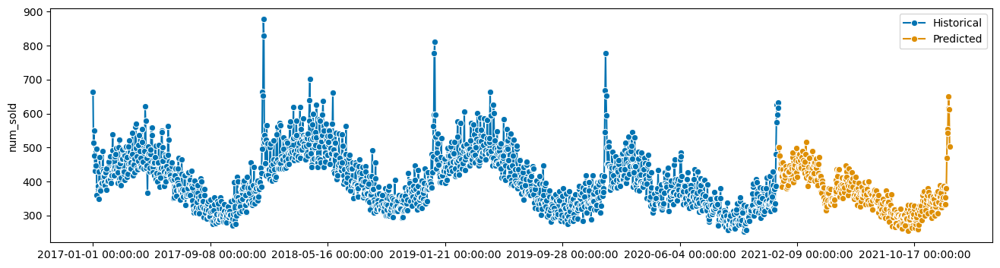

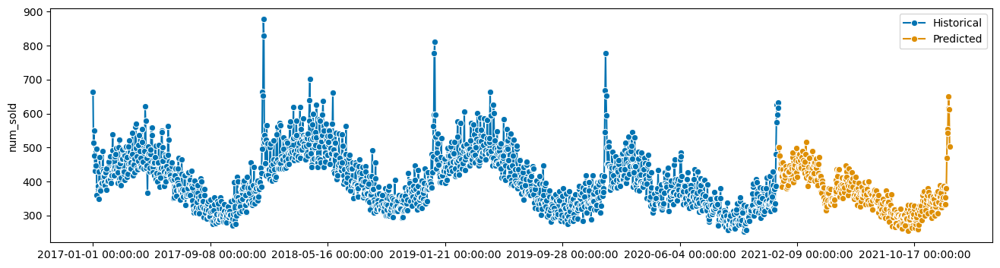

In [15]:
from sktime.forecasting.model_selection import ForecastingRandomizedSearchCV
y_train = sample_timeseries['num_sold']
y_train.index = pd.DatetimeIndex(sample_timeseries['date'], freq='D')

predicted_dates = pd.DatetimeIndex(sample_test['date'], freq='D')
gradient_booster = make_reduction(LGBMRegressor(objective ='regression',
                                                metric = 'mae',
                                                random_state = 42,
                                                max_depth=5,
                                                num_leaves=20,
                                                learning_rate=.2), window_length=5)

forecaster = TransformedTargetForecaster(steps=[
    ("Deseasonalize_Year", Deseasonalizer(sp=365, model='multiplicative')),
    ("Deseasonalize_Month", Deseasonalizer(sp=30, model='multiplicative')),
    ("Deseasonalize_Week", Deseasonalizer(sp=7, model='multiplicative')),
    ("Booster", gradient_booster),
])

pipe = ForecastingPipeline(steps=[("Scaler", TabularToSeriesAdaptor(StandardScaler())), ("Forecaster", forecaster)])

# Forecast product sales for the next year
fh=ForecastingHorizon(predicted_dates, is_relative=False)
pipe.fit(y=y_train, X=X_train)
y_pred = pipe.predict(fh=fh, X=X_test)
print(pipe.score(y_train[-365:], X=X_train[-365:]))

plot_series(y_train, y_pred, labels=['Historical', 'Predicted'])
plt.show()


## Repeating the Process for All 48 Product Combinations

Predicting product ['Belgium' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['Belgium' 'KaggleMart' 'Kaggle Advanced Techniques']
0.0670795376871714
0.0670795376871714


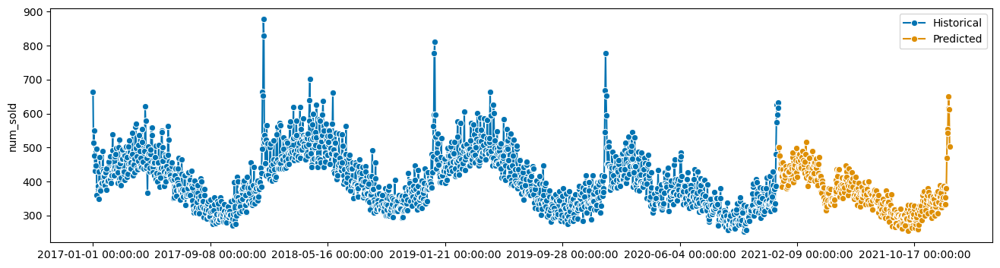

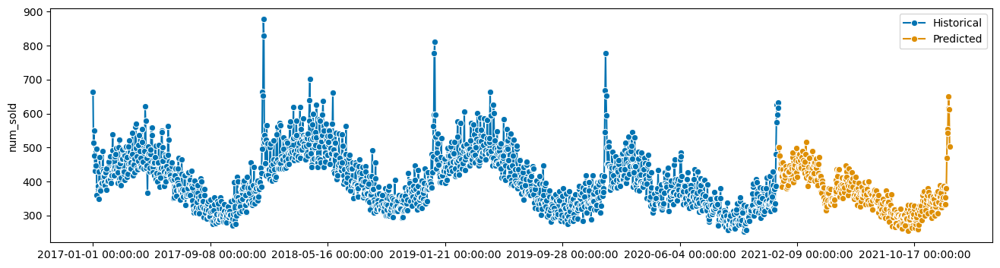

Predicting product ['Belgium' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['Belgium' 'KaggleMart' 'Kaggle Getting Started']
0.06520825184596979
0.06520825184596979


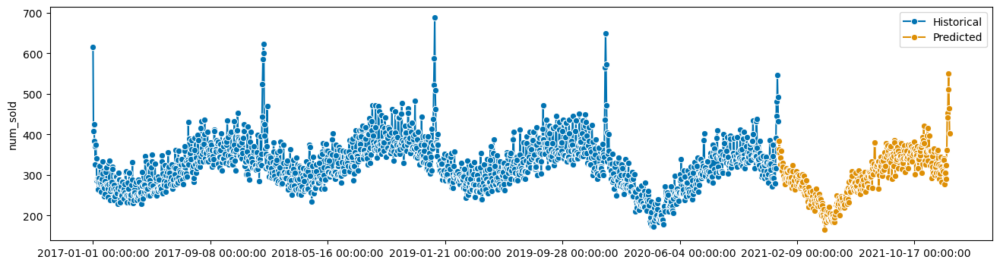

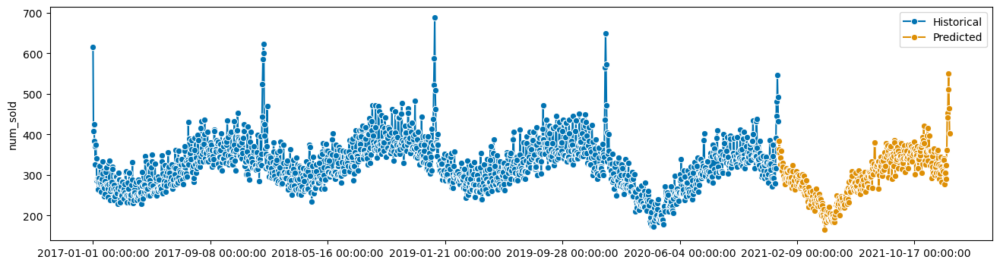

Predicting product ['Belgium' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['Belgium' 'KaggleMart' 'Kaggle Recipe Book']
0.06784091832887058
0.06784091832887058


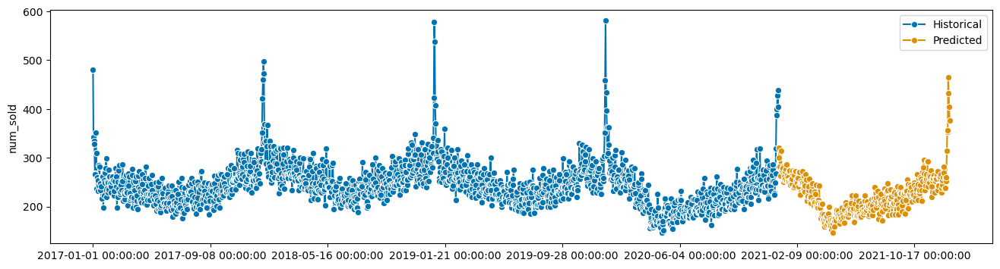

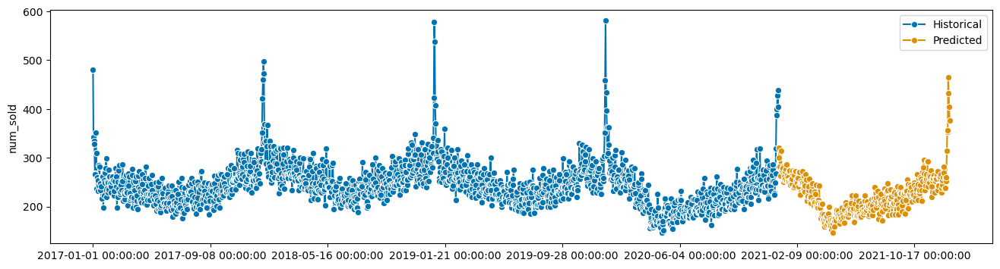

Predicting product ['Belgium' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Belgium' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.08014372139308028
0.08014372139308028


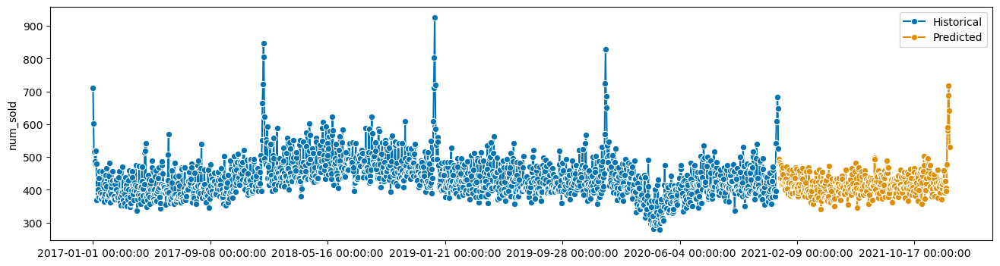

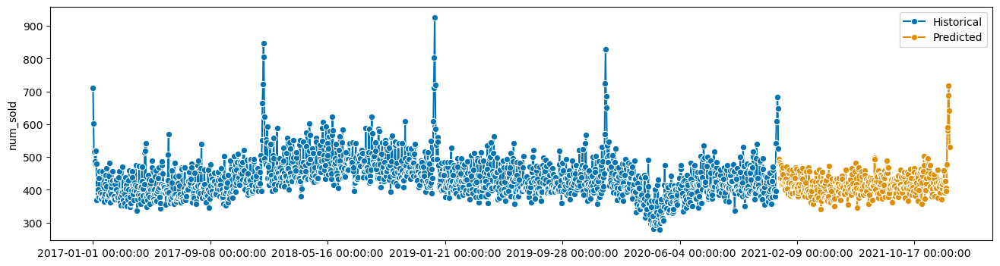

Predicting product ['Belgium' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['Belgium' 'KaggleRama' 'Kaggle Advanced Techniques']
0.06934952376982316
0.06934952376982316


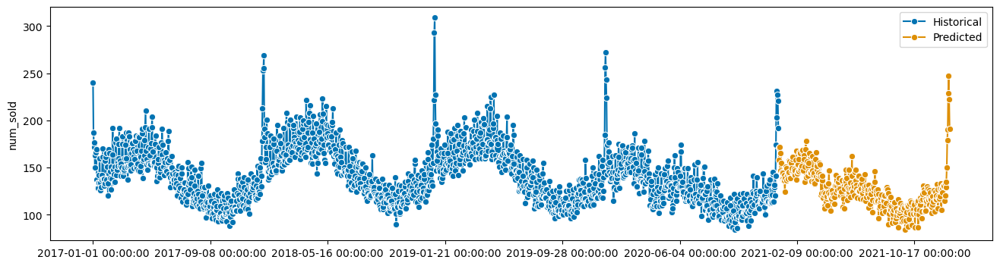

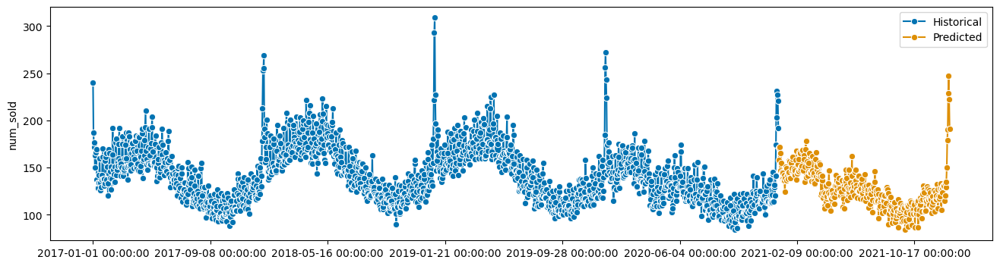

Predicting product ['Belgium' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['Belgium' 'KaggleRama' 'Kaggle Getting Started']
0.0660118105590091
0.0660118105590091


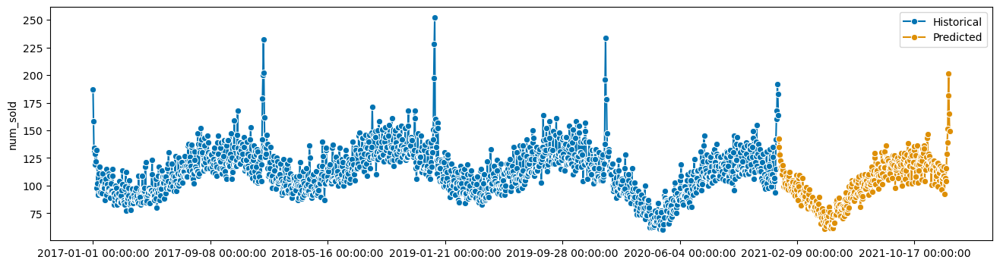

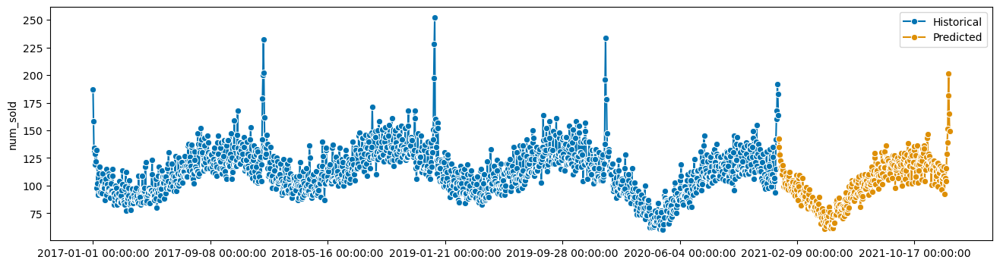

Predicting product ['Belgium' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['Belgium' 'KaggleRama' 'Kaggle Recipe Book']
0.06486046745131699
0.06486046745131699


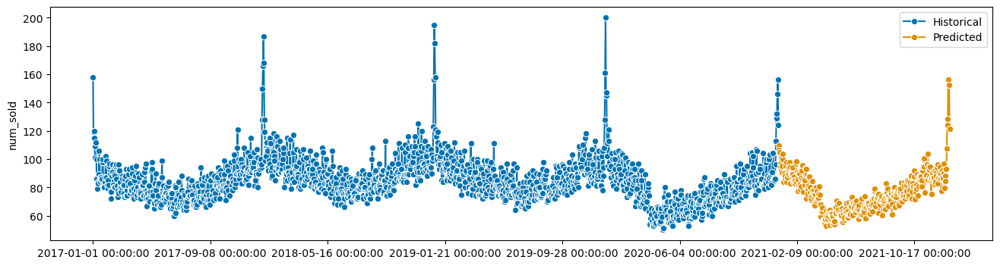

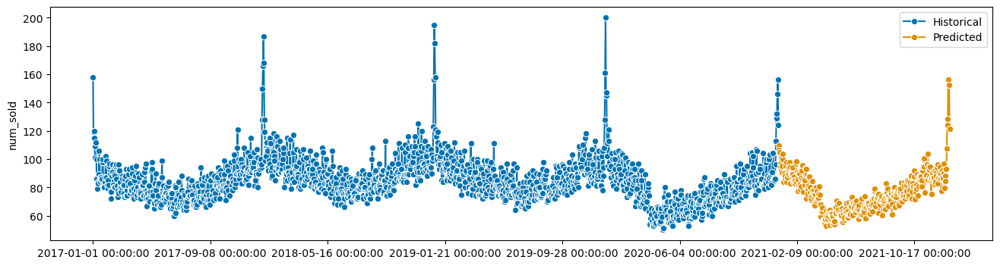

Predicting product ['Belgium' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Belgium' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.07215629457132838
0.07215629457132838


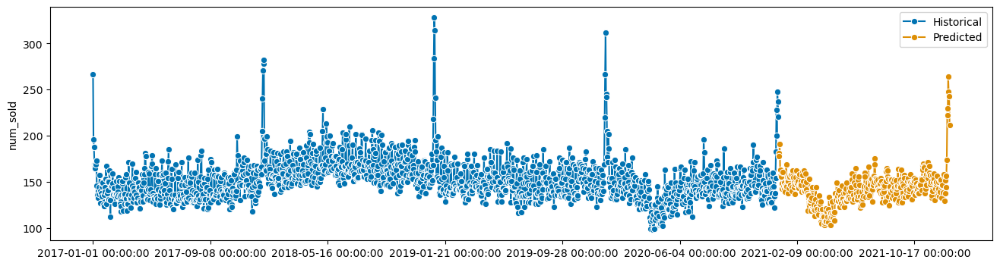

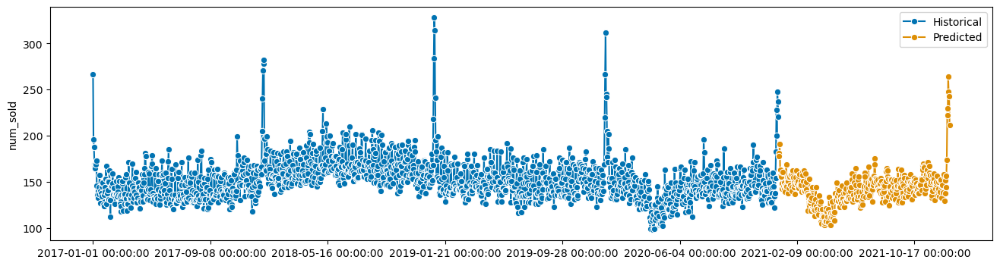

Predicting product ['France' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['France' 'KaggleMart' 'Kaggle Advanced Techniques']
0.06730643613422678
0.06730643613422678


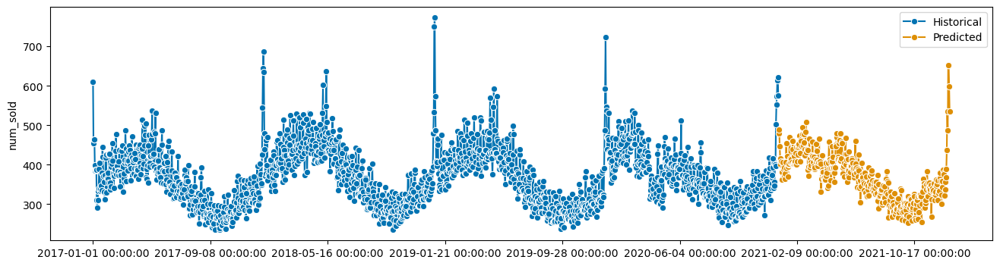

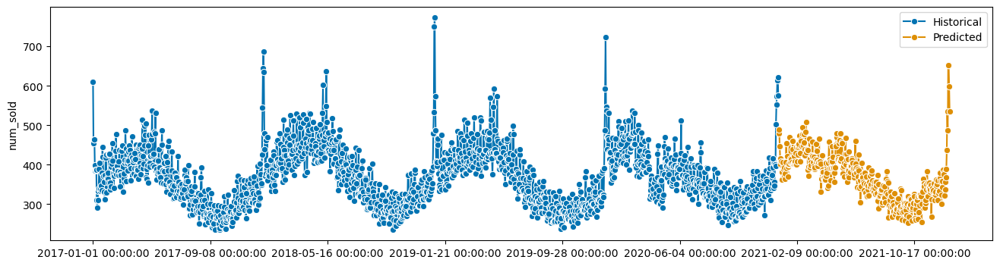

Predicting product ['France' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['France' 'KaggleMart' 'Kaggle Getting Started']
0.0827044590619957
0.0827044590619957


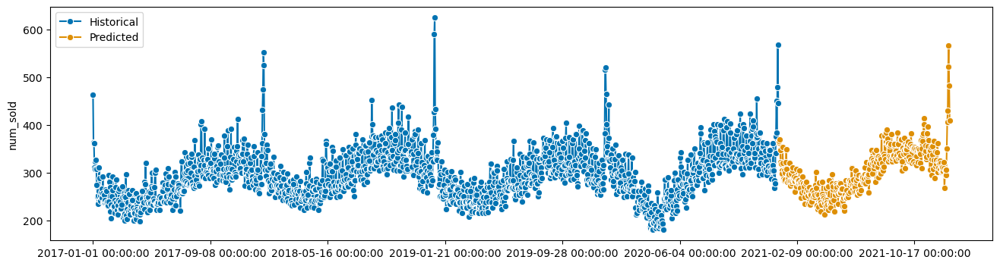

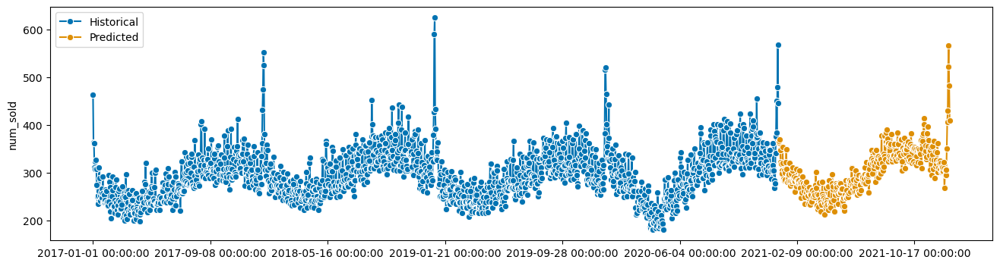

Predicting product ['France' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['France' 'KaggleMart' 'Kaggle Recipe Book']
0.0820040956575095
0.0820040956575095


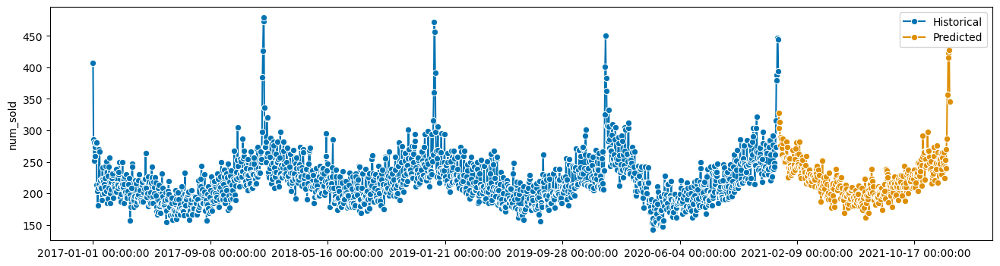

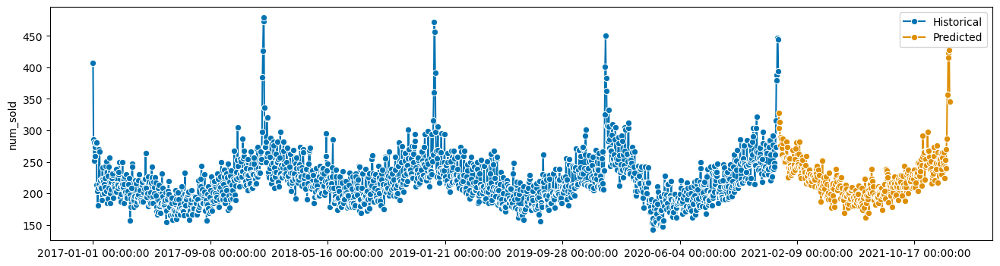

Predicting product ['France' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['France' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.09165973917029181
0.09165973917029181


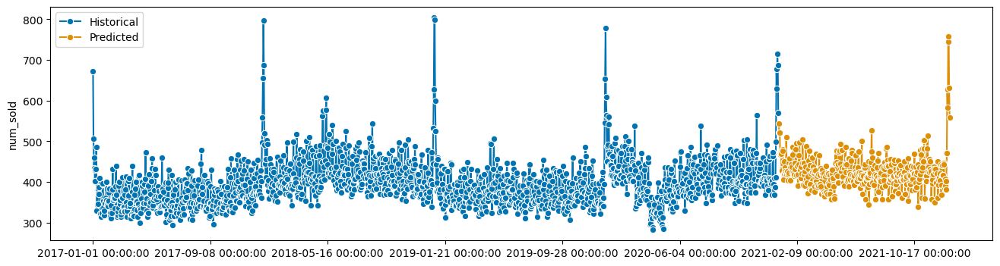

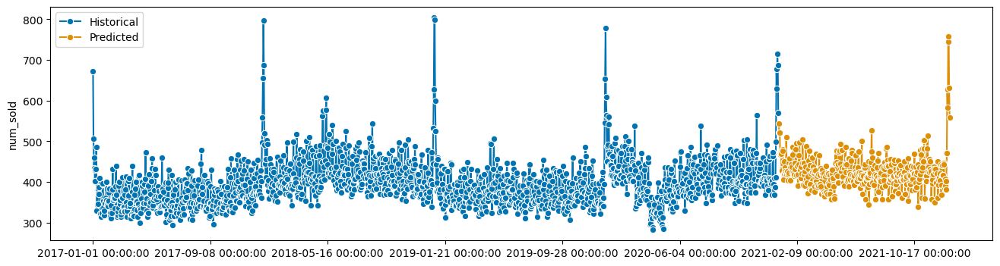

Predicting product ['France' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['France' 'KaggleRama' 'Kaggle Advanced Techniques']
0.08409264742764862
0.08409264742764862


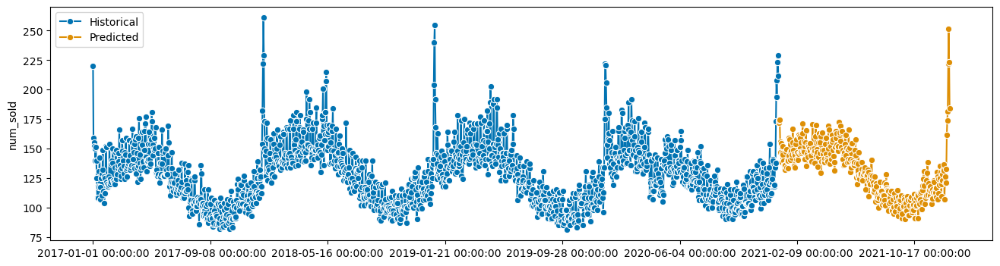

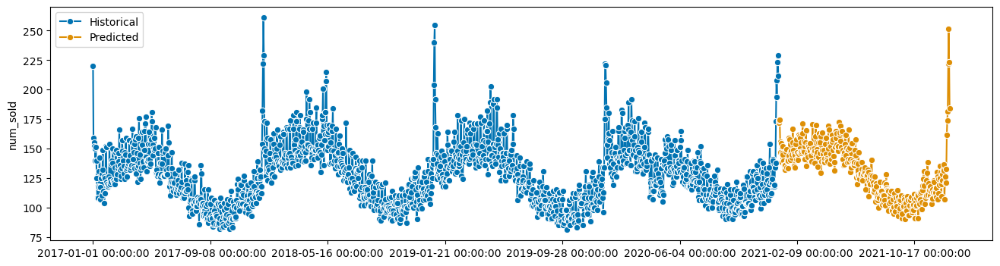

Predicting product ['France' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['France' 'KaggleRama' 'Kaggle Getting Started']
0.09141960201411979
0.09141960201411979


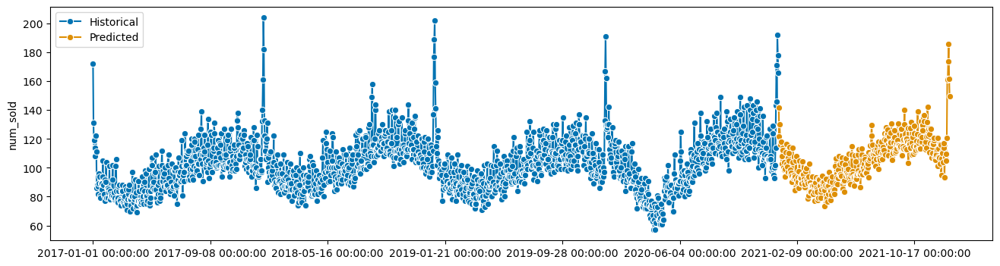

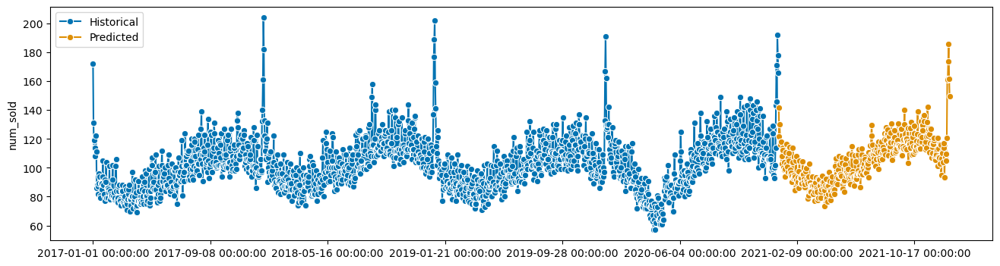

Predicting product ['France' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['France' 'KaggleRama' 'Kaggle Recipe Book']
0.08214272499520711
0.08214272499520711


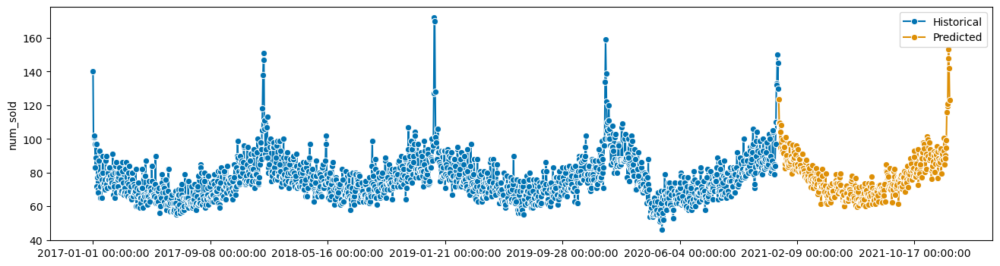

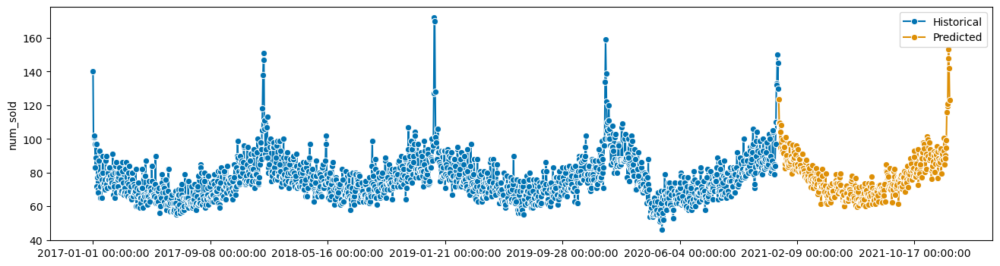

Predicting product ['France' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['France' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.0984663192879467
0.0984663192879467


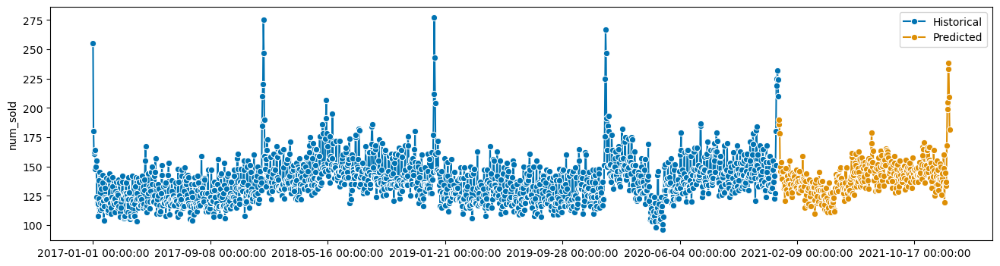

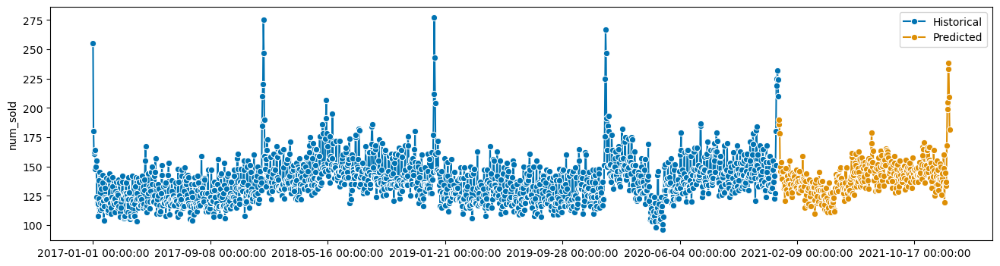

Predicting product ['Germany' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['Germany' 'KaggleMart' 'Kaggle Advanced Techniques']
0.0669664550031741
0.0669664550031741


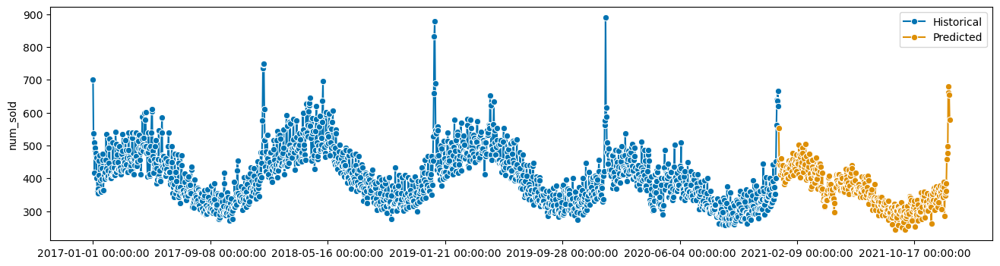

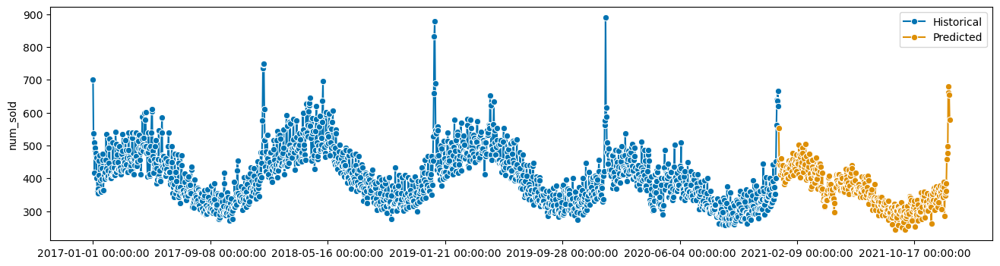

Predicting product ['Germany' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['Germany' 'KaggleMart' 'Kaggle Getting Started']
0.06450468456890722
0.06450468456890722


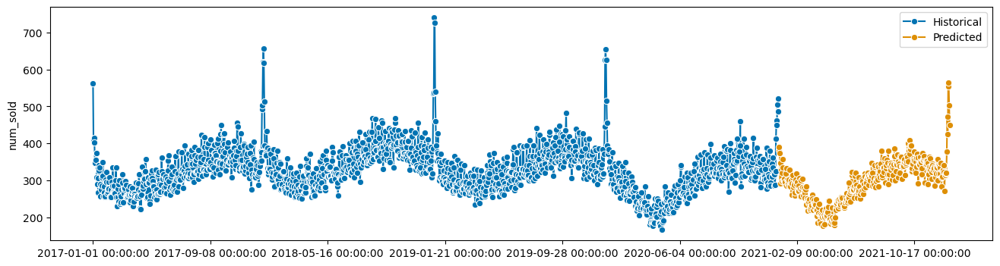

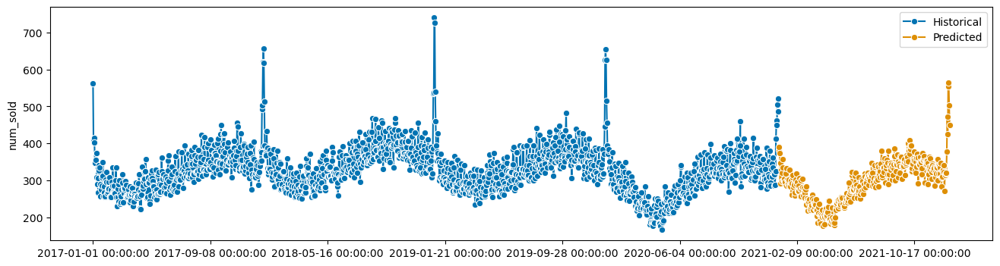

Predicting product ['Germany' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['Germany' 'KaggleMart' 'Kaggle Recipe Book']
0.06748631022953111
0.06748631022953111


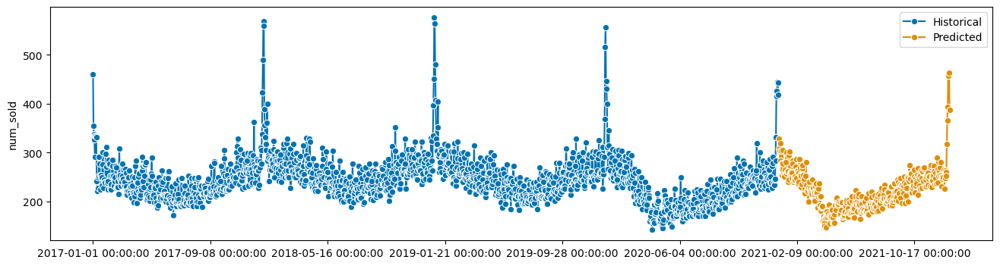

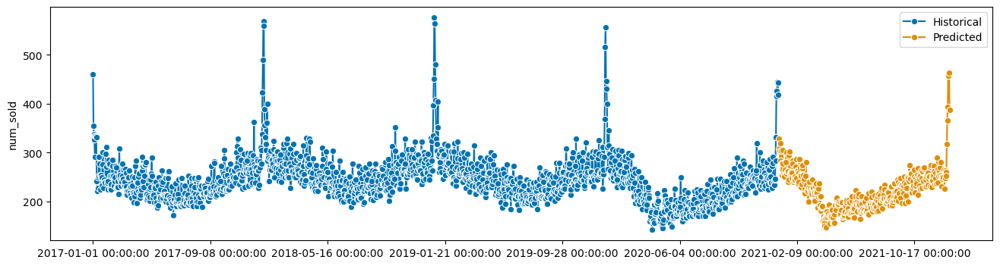

Predicting product ['Germany' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Germany' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.0725021673160488
0.0725021673160488


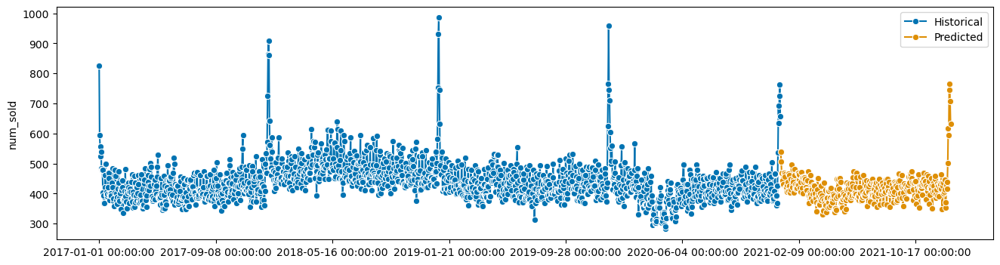

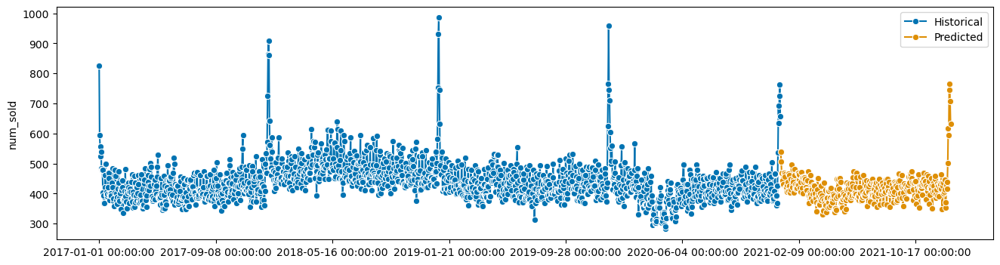

Predicting product ['Germany' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['Germany' 'KaggleRama' 'Kaggle Advanced Techniques']
0.06691156885803252
0.06691156885803252


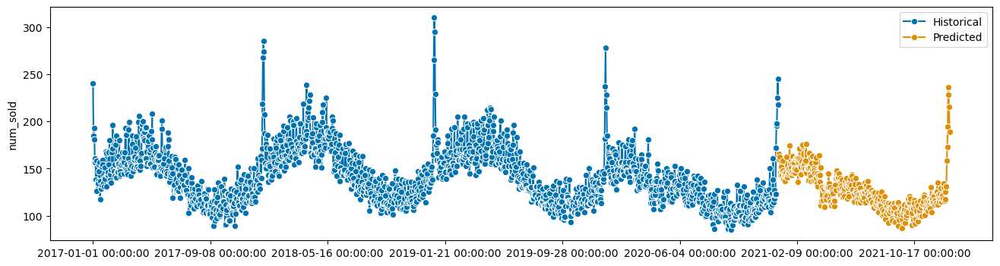

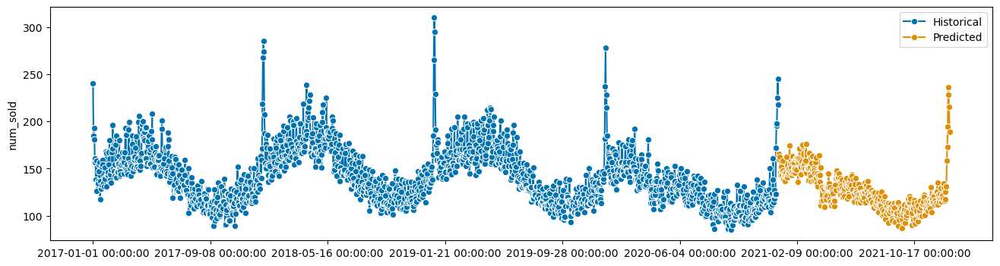

Predicting product ['Germany' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['Germany' 'KaggleRama' 'Kaggle Getting Started']
0.06512187245960604
0.06512187245960604


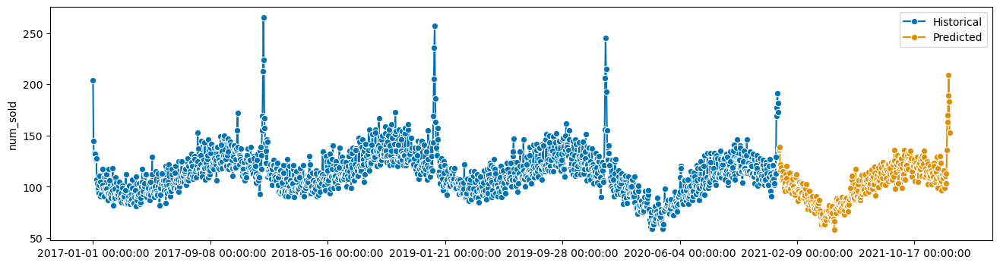

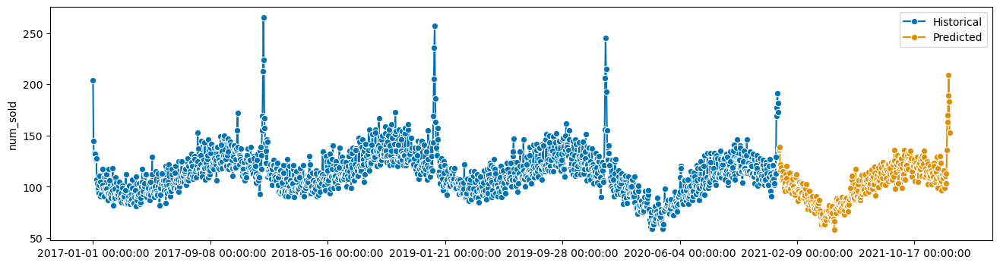

Predicting product ['Germany' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['Germany' 'KaggleRama' 'Kaggle Recipe Book']
0.0667520063799115
0.0667520063799115


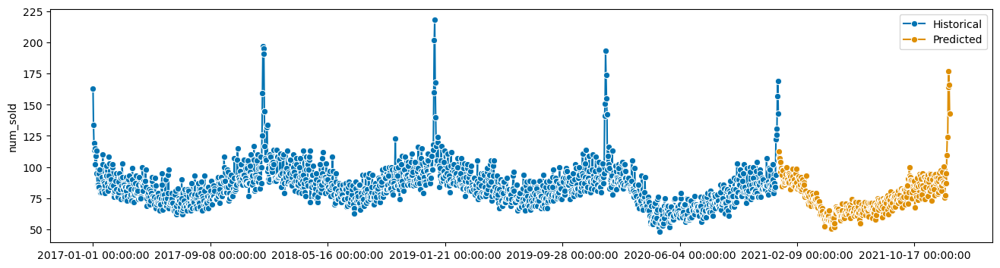

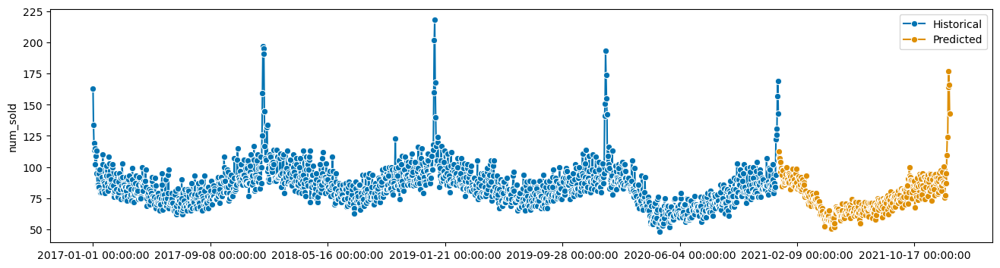

Predicting product ['Germany' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Germany' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.0733252276384148
0.0733252276384148


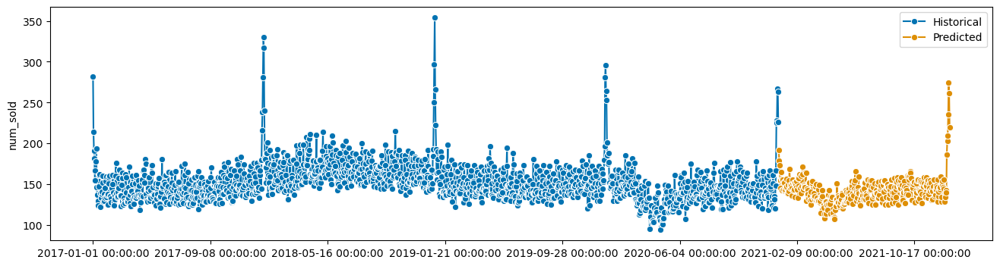

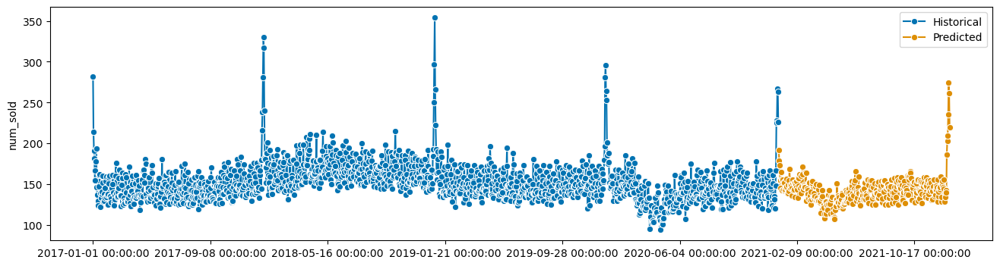

Predicting product ['Italy' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['Italy' 'KaggleMart' 'Kaggle Advanced Techniques']
0.06162855690932246
0.06162855690932246


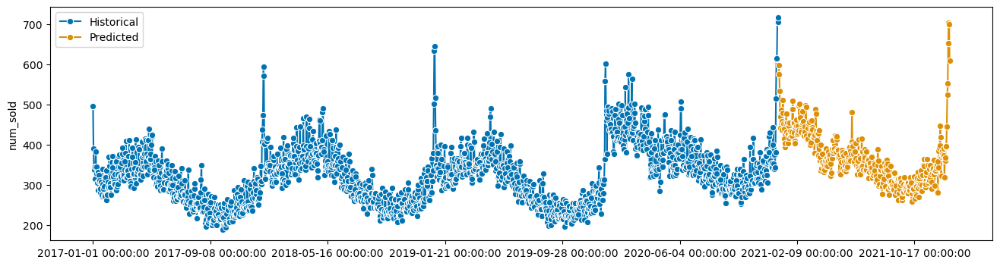

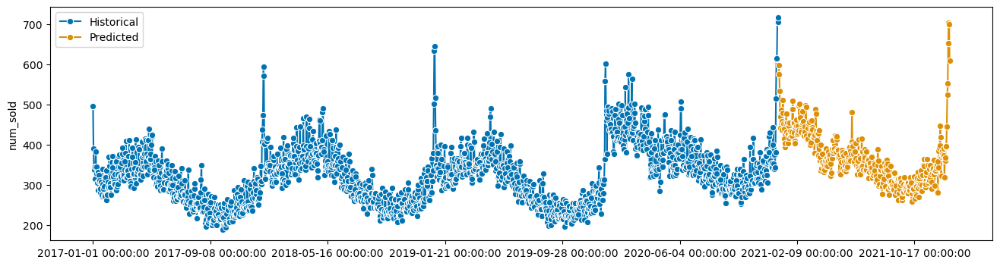

Predicting product ['Italy' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['Italy' 'KaggleMart' 'Kaggle Getting Started']
0.06716793079752942
0.06716793079752942


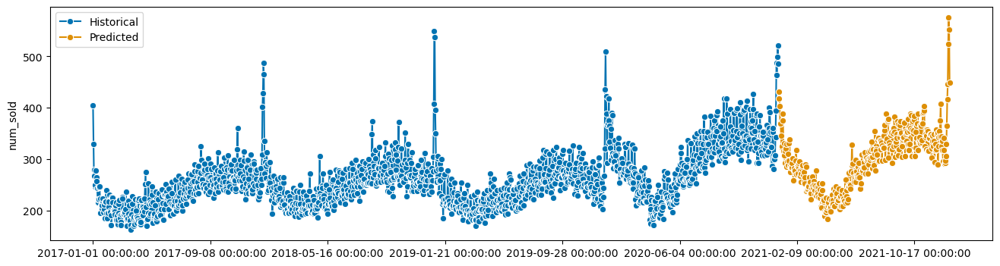

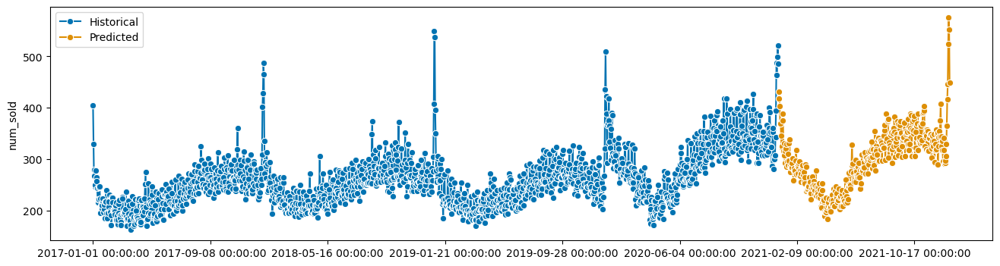

Predicting product ['Italy' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['Italy' 'KaggleMart' 'Kaggle Recipe Book']
0.06609534745693509
0.06609534745693509


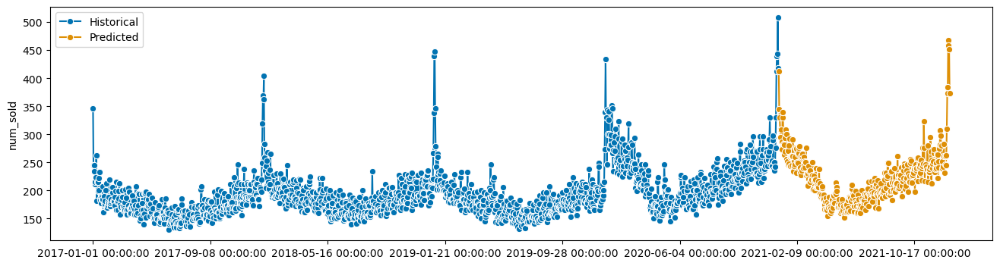

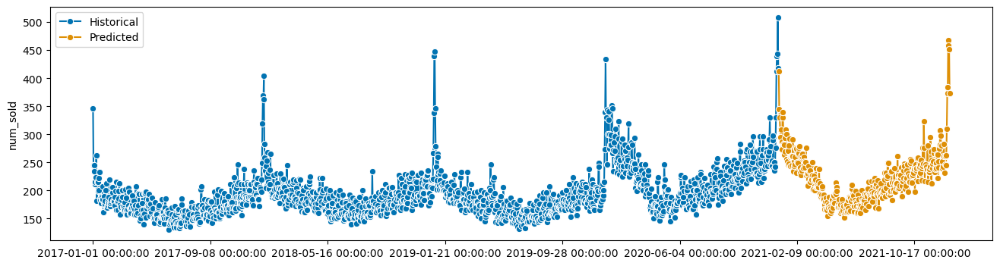

Predicting product ['Italy' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Italy' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.06546919310576964
0.06546919310576964


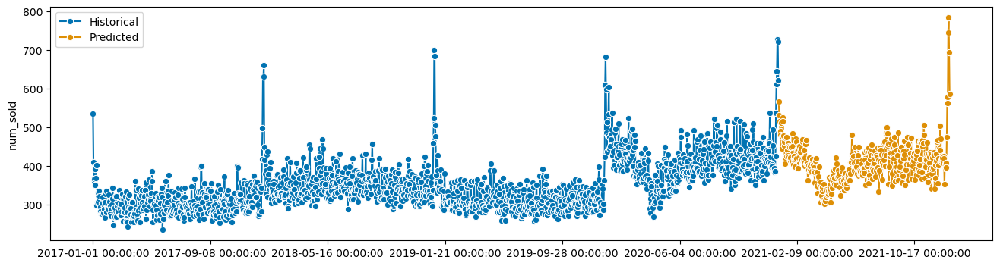

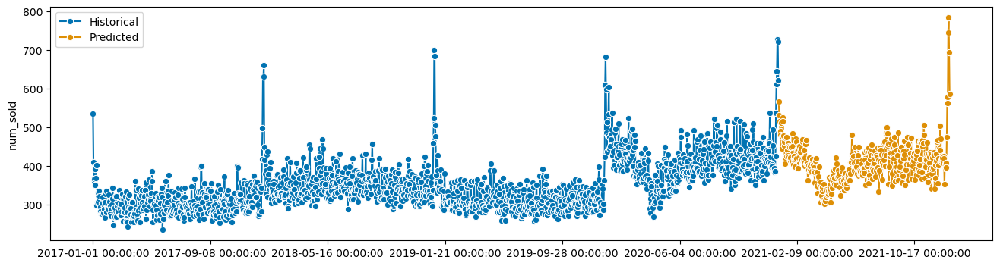

Predicting product ['Italy' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['Italy' 'KaggleRama' 'Kaggle Advanced Techniques']
0.06773893880435668
0.06773893880435668


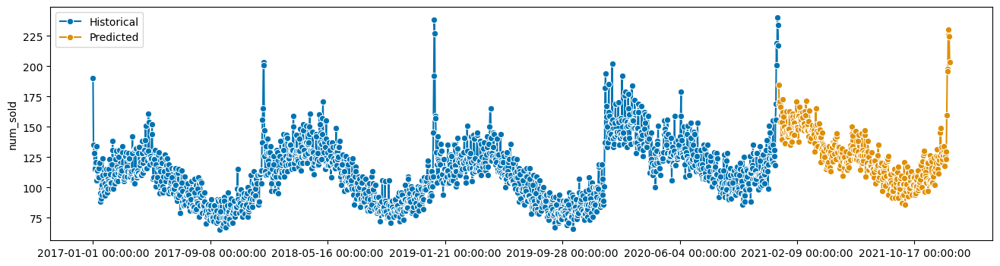

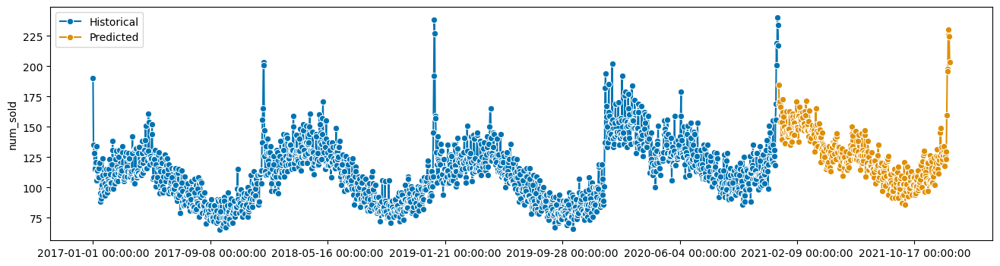

Predicting product ['Italy' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['Italy' 'KaggleRama' 'Kaggle Getting Started']
0.06219475274367412
0.06219475274367412


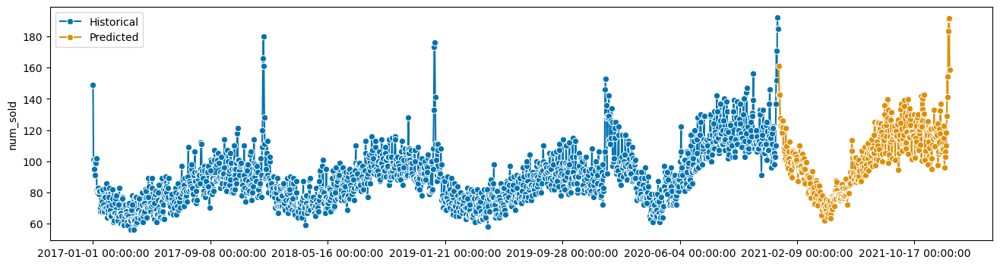

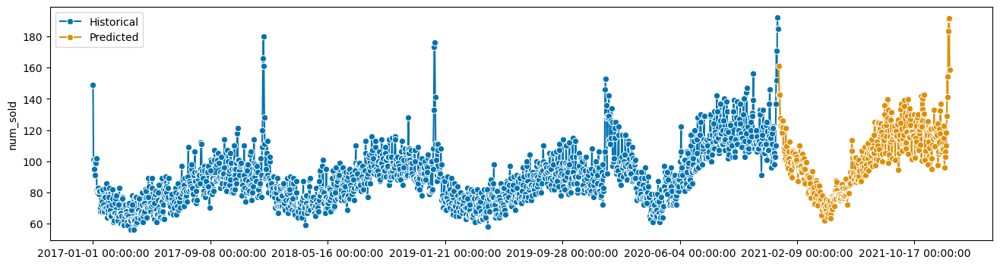

Predicting product ['Italy' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['Italy' 'KaggleRama' 'Kaggle Recipe Book']
0.07456190096403095
0.07456190096403095


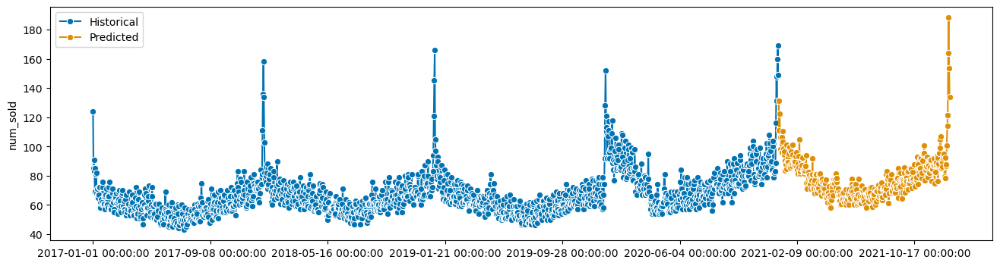

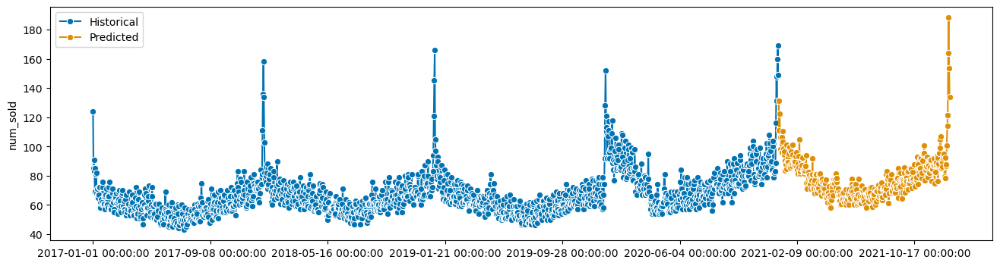

Predicting product ['Italy' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Italy' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.06778657203041207
0.06778657203041207


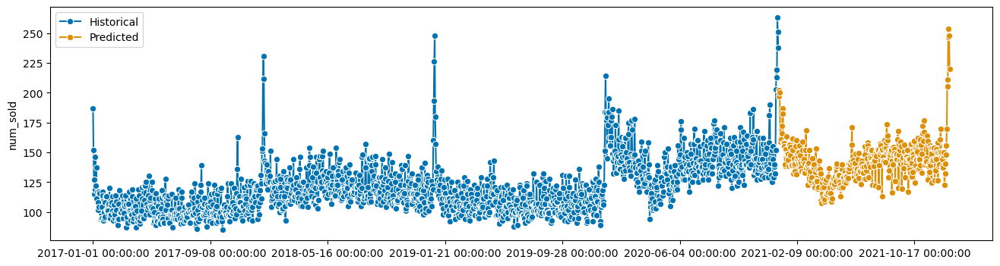

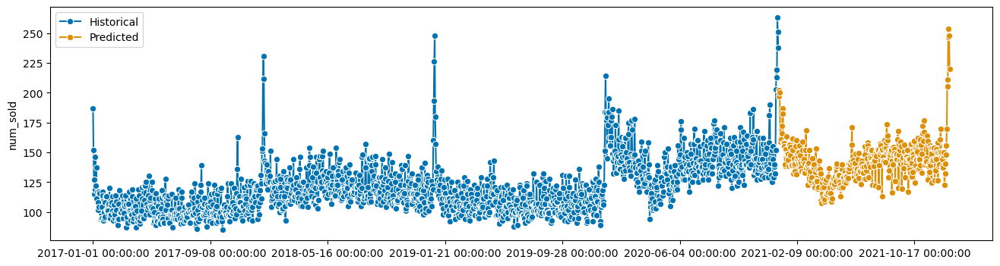

Predicting product ['Poland' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['Poland' 'KaggleMart' 'Kaggle Advanced Techniques']
0.06307906148715016
0.06307906148715016


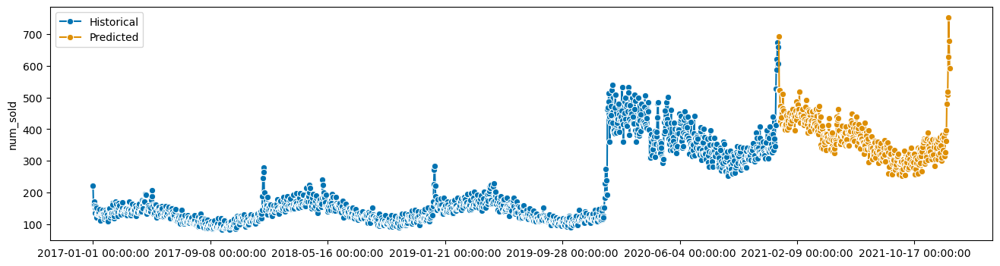

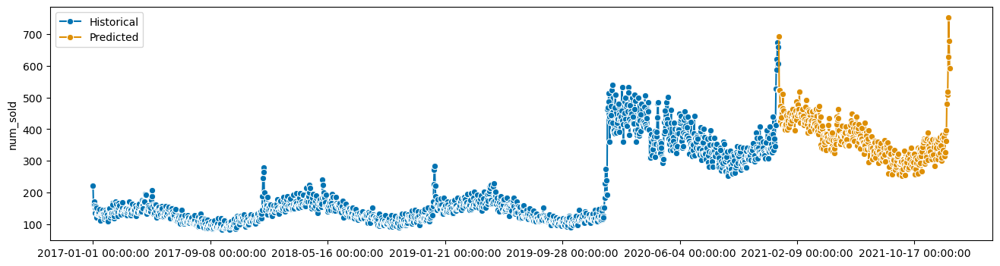

Predicting product ['Poland' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['Poland' 'KaggleMart' 'Kaggle Getting Started']
0.06725625293950425
0.06725625293950425


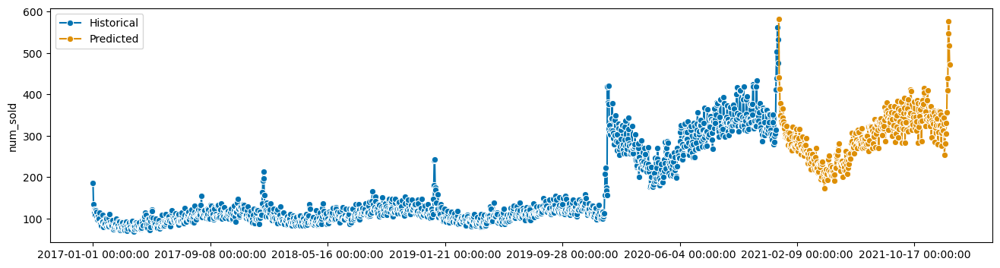

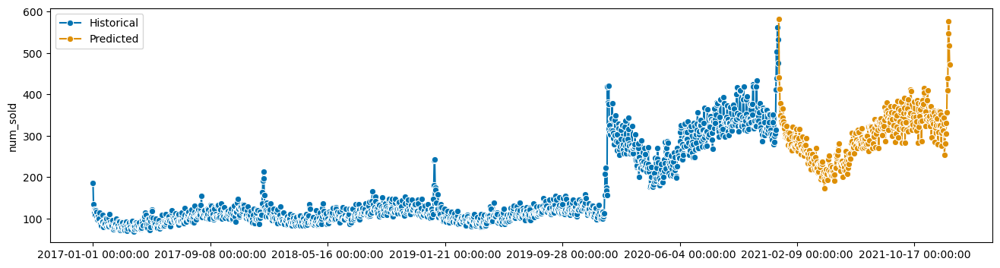

Predicting product ['Poland' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['Poland' 'KaggleMart' 'Kaggle Recipe Book']
0.06224797154385347
0.06224797154385347


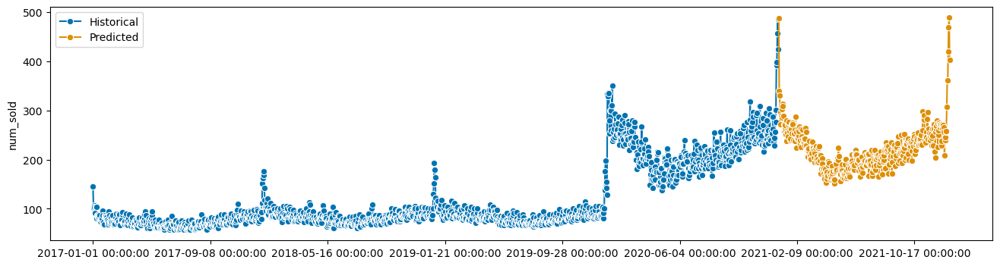

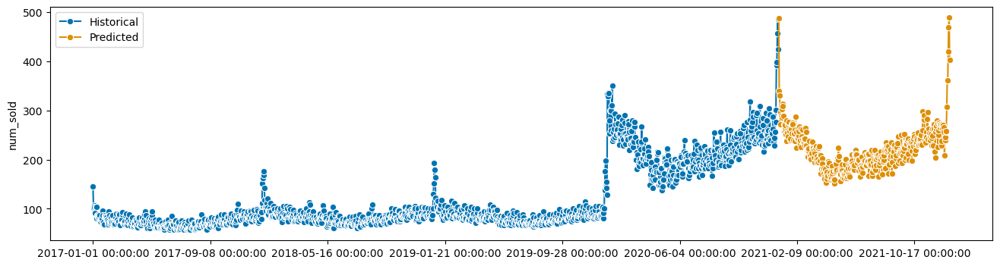

Predicting product ['Poland' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Poland' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.0675243362774793
0.0675243362774793


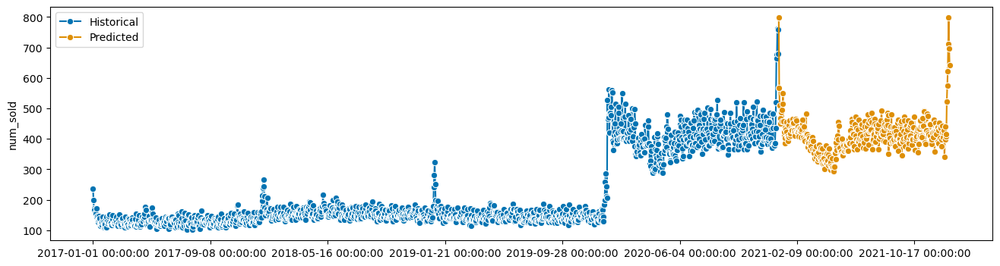

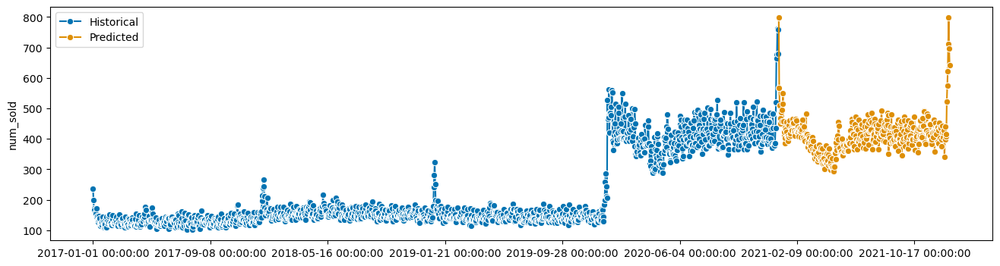

Predicting product ['Poland' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['Poland' 'KaggleRama' 'Kaggle Advanced Techniques']
0.06719494866645549
0.06719494866645549


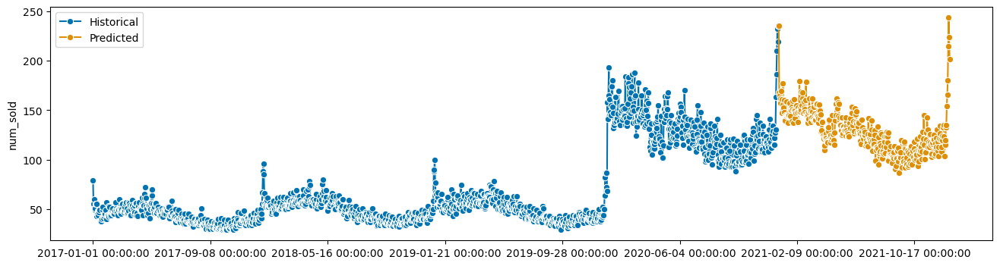

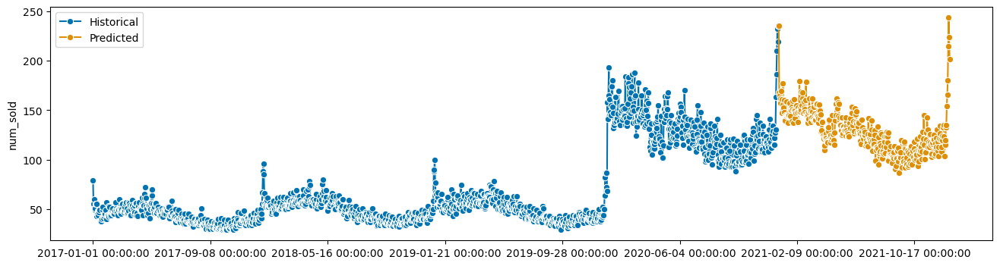

Predicting product ['Poland' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['Poland' 'KaggleRama' 'Kaggle Getting Started']
0.06900637246770026
0.06900637246770026


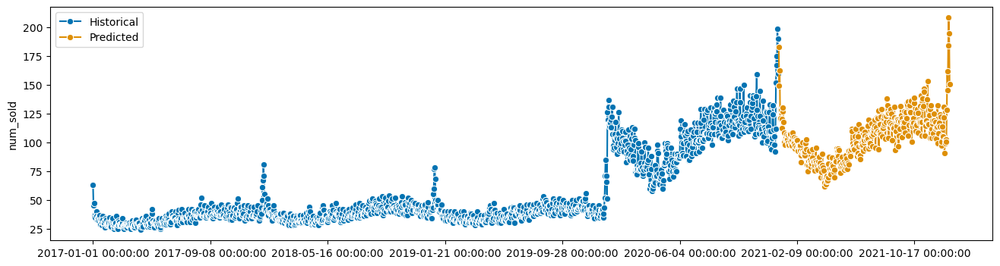

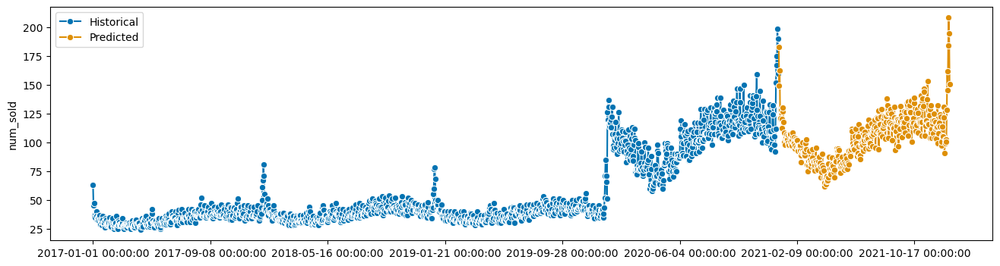

Predicting product ['Poland' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['Poland' 'KaggleRama' 'Kaggle Recipe Book']
0.065223170327812
0.065223170327812


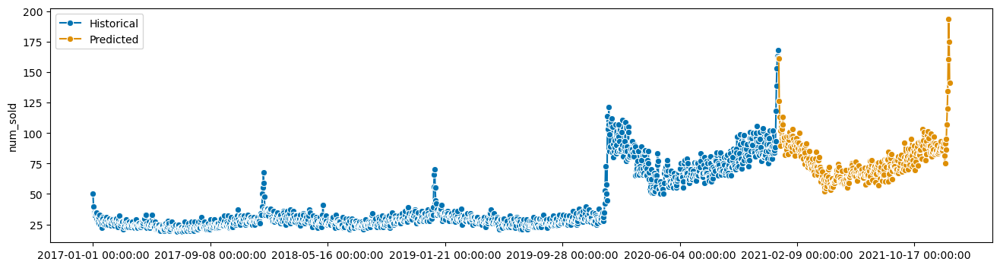

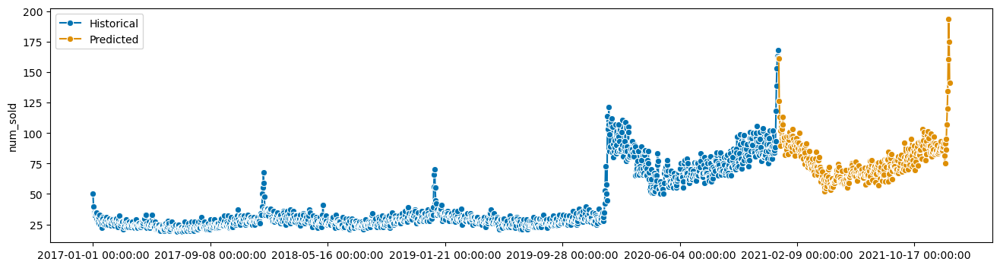

Predicting product ['Poland' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Poland' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.06504982285585215
0.06504982285585215


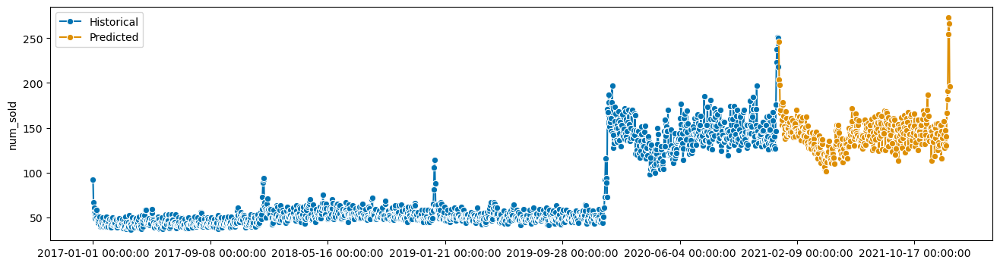

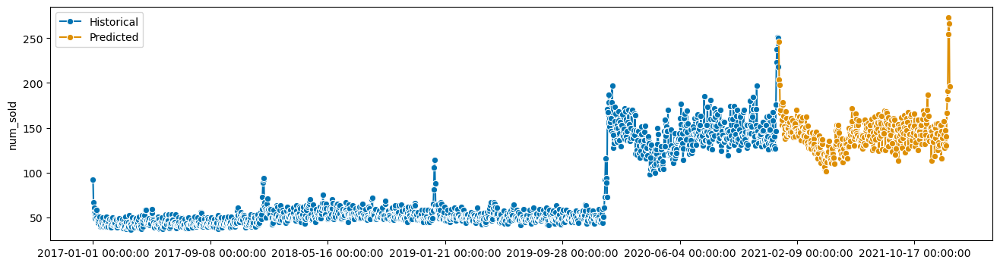

Predicting product ['Spain' 'KaggleMart' 'Kaggle Advanced Techniques']
Predicting product ['Spain' 'KaggleMart' 'Kaggle Advanced Techniques']
0.06070047448780586
0.06070047448780586


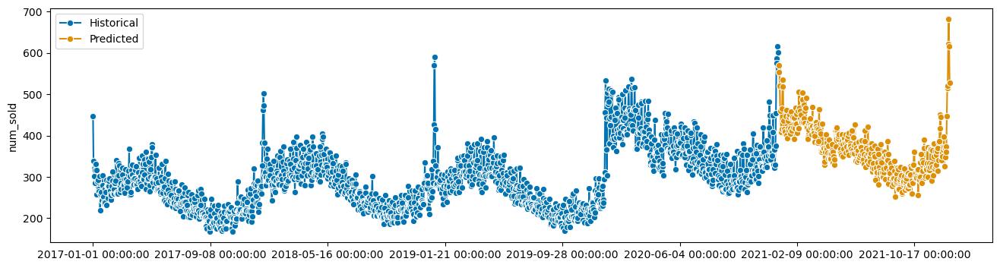

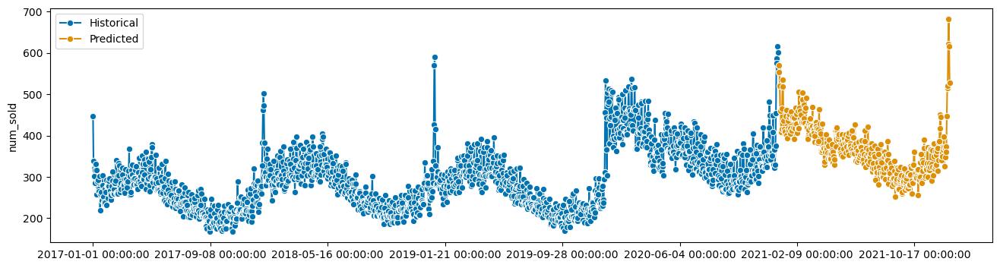

Predicting product ['Spain' 'KaggleMart' 'Kaggle Getting Started']
Predicting product ['Spain' 'KaggleMart' 'Kaggle Getting Started']
0.06293206931419917
0.06293206931419917


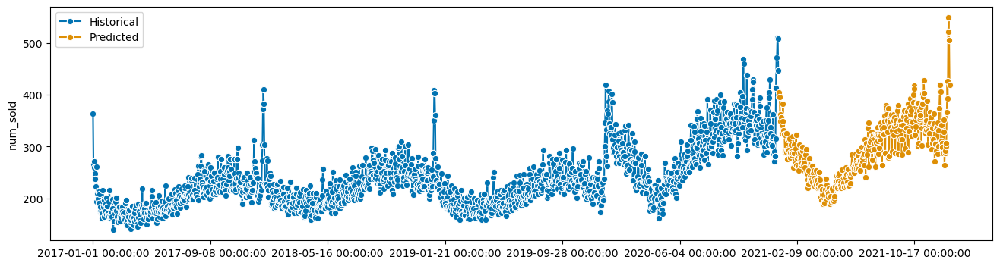

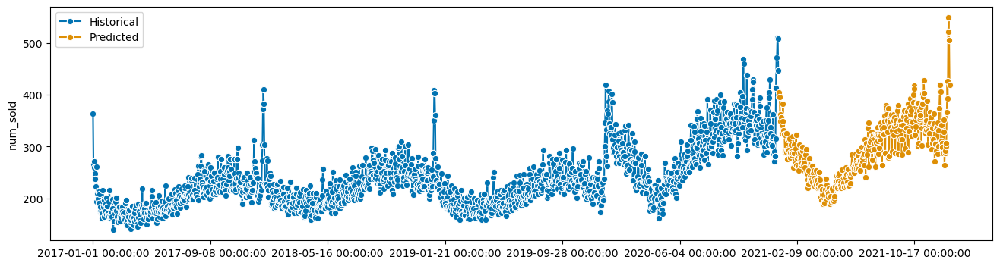

Predicting product ['Spain' 'KaggleMart' 'Kaggle Recipe Book']
Predicting product ['Spain' 'KaggleMart' 'Kaggle Recipe Book']
0.07179248680848652
0.07179248680848652


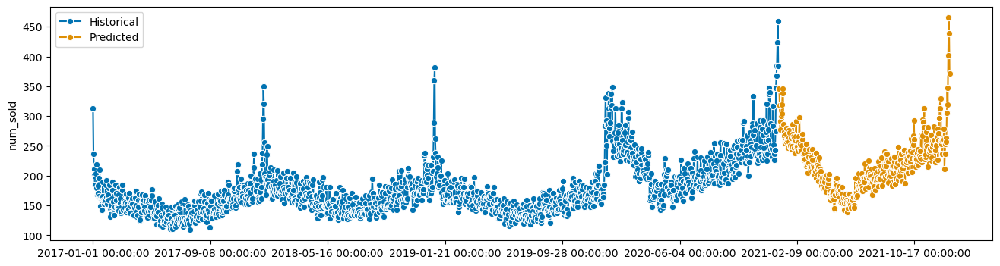

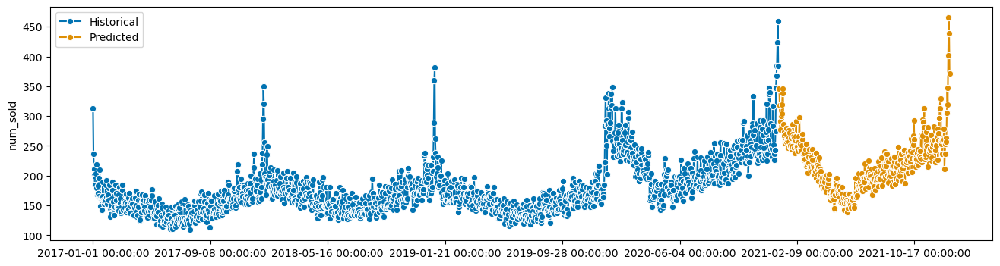

Predicting product ['Spain' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Spain' 'KaggleMart' 'Kaggle for Kids: One Smart Goose']
0.0688732821166749
0.0688732821166749


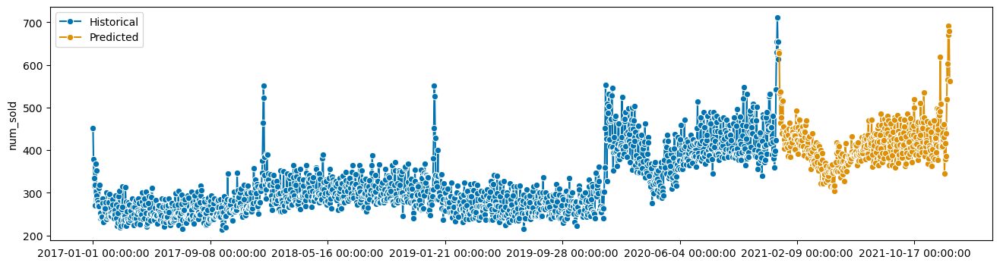

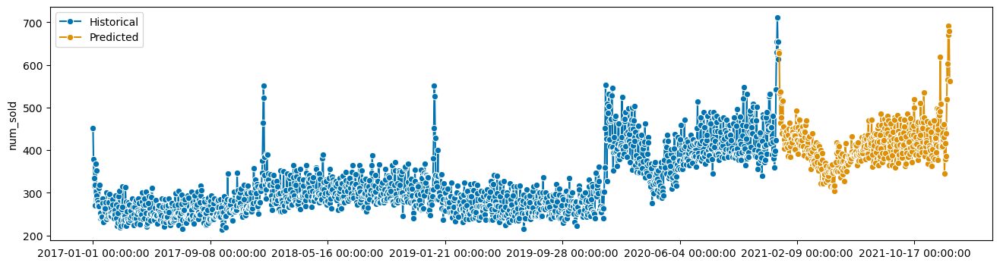

Predicting product ['Spain' 'KaggleRama' 'Kaggle Advanced Techniques']
Predicting product ['Spain' 'KaggleRama' 'Kaggle Advanced Techniques']
0.0646941813212913
0.0646941813212913


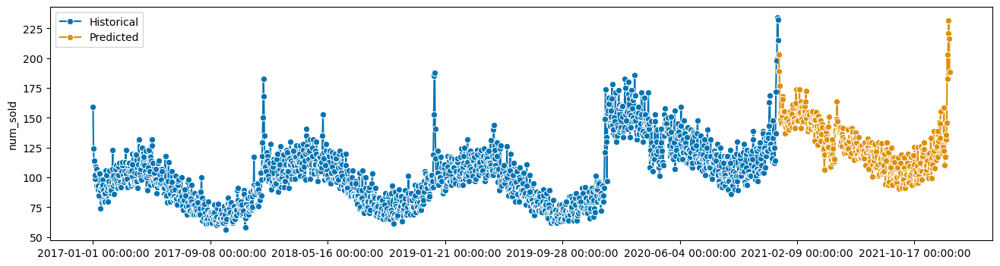

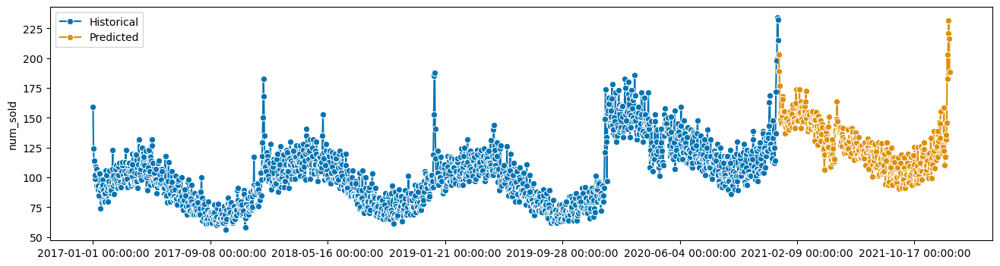

Predicting product ['Spain' 'KaggleRama' 'Kaggle Getting Started']
Predicting product ['Spain' 'KaggleRama' 'Kaggle Getting Started']
0.06242306192837527
0.06242306192837527


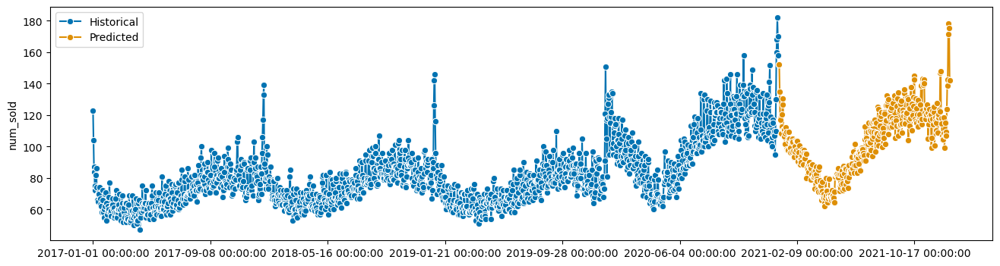

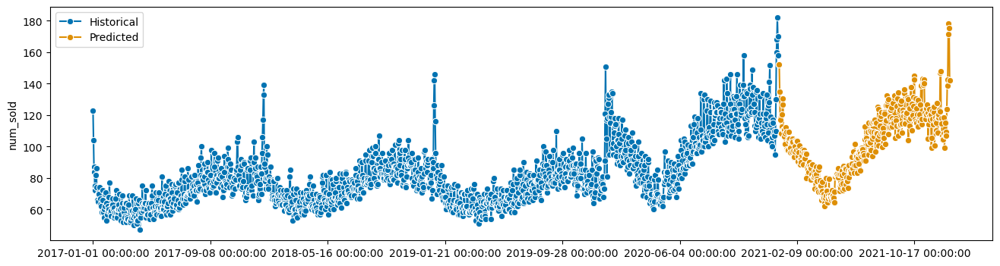

Predicting product ['Spain' 'KaggleRama' 'Kaggle Recipe Book']
Predicting product ['Spain' 'KaggleRama' 'Kaggle Recipe Book']
0.06334213262786255
0.06334213262786255


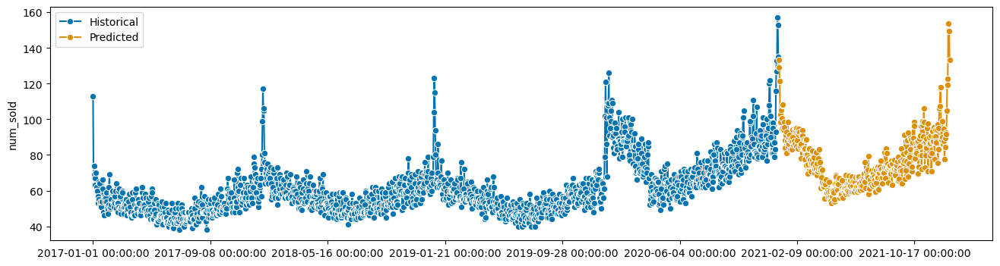

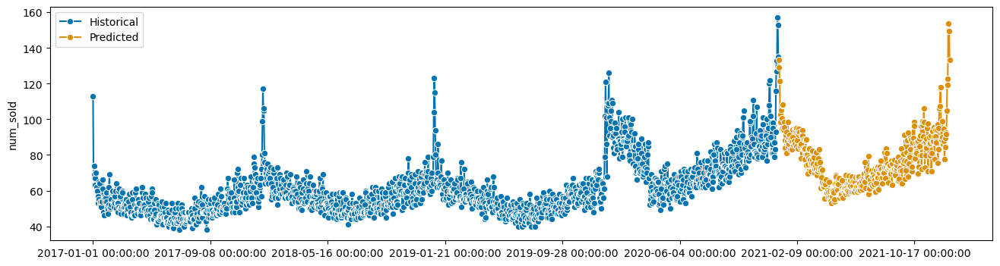

Predicting product ['Spain' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
Predicting product ['Spain' 'KaggleRama' 'Kaggle for Kids: One Smart Goose']
0.06436182897670836
0.06436182897670836


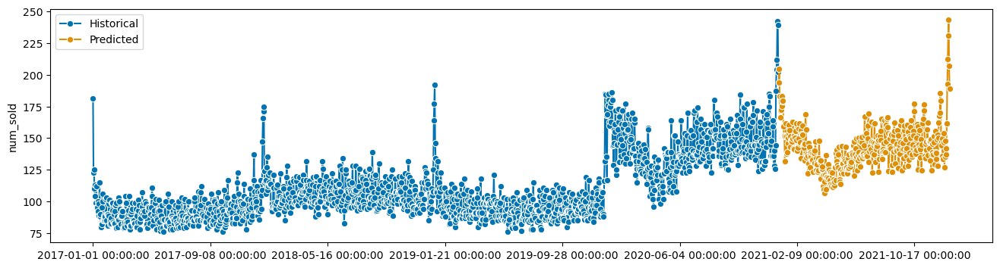

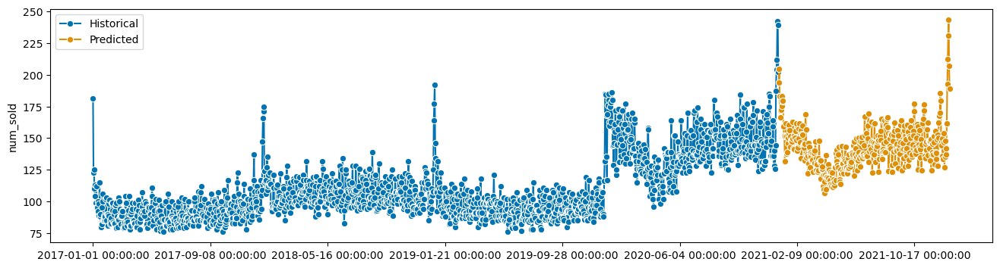

In [16]:
submission_file = pd.DataFrame()
total_score = 0
combinations = train[['country', 'store', 'product']].drop_duplicates(keep='first')

# Get next slice of country store product combinations by date
for i in range(48):
    
    print(f"Predicting product {combinations.iloc[i].values}")
    
# Create series to forecast
    sample_timeseries = train[i::48]
    sample_test = test[i::48]
    y_train = sample_timeseries['num_sold']
    y_train.index = pd.DatetimeIndex(sample_timeseries['date'], freq='D')
    predicted_dates = pd.DatetimeIndex(sample_test['date'], freq='D')

# Create features
    X_train = pd.DataFrame()
    X_train.index = pd.DatetimeIndex(sample_timeseries['date'], freq='D')
    X_test = pd.DataFrame()
    X_test.index = pd.DatetimeIndex(sample_test['date'], freq='D')
    
# Date features
    X_train['dayofweek'] = sample_timeseries['date'].dt.dayofweek.values
    X_test['dayofweek'] = sample_test['date'].dt.dayofweek.values
    
    X_train['dayofmonth'] = sample_timeseries['date'].dt.day.values
    X_test['dayofmonth'] = sample_test['date'].dt.day.values
    
    X_train['dayofyear'] = sample_timeseries['date'].dt.dayofyear.values
    X_test['dayofyear'] = sample_test['date'].dt.dayofyear.values
    
    X_train['month'] = sample_timeseries['date'].dt.month.values
    X_test['month'] = sample_test['date'].dt.month.values
    
    X_train['year'] = sample_timeseries['date'].dt.year.values - sample_timeseries['date'].dt.year.min()
    X_test['year'] = sample_test['date'].dt.year.values - sample_timeseries['date'].dt.year.min()
    
# Fourier Features
    X_train[['Sin', 'Cos']] = cal_fourier_gen.in_sample(X_train.index)
    X_test[['Sin', 'Cos']] = cal_fourier_gen.in_sample(X_test.index)
    
# Pandemic (Did not end in 2020)
    X_train['Pandemic'] = (y_train.index.year >= 2020).astype(int)
    X_test['Pandemic'] = (X_test.index.year >= 2020).astype(int)
    
    pipe = ForecastingPipeline(steps=[("Scaler", TabularToSeriesAdaptor(StandardScaler())), ("Forecaster", forecaster)])
    
# Forecast product sales for the next year
    pipe.fit(y_train, X_train, fh=fh)
    y_pred = pipe.predict(fh=ForecastingHorizon(predicted_dates, is_relative=False), X=X_test)

# Print SMAPE on last 365 days of training data
    score = pipe.score(y_train[-365:], X_train[-365:])
    print(score)
    total_score += score
    
# Plot projected sales
    plot_series(y_train, y_pred, labels=['Historical', 'Predicted'])
    plt.show()
    
# Append projected sales to new dataframe with index. This will be the submission file.
    with_index = pd.DataFrame(y_pred.values, index=sample_test.index, columns=['num_sold'])
    submission_file = pd.concat([submission_file, with_index], axis=0)


## Submission

In [17]:
# Sort dataframe by index to make sure it matches with submission
print("Unofficial Score", total_score / 48 * 100)
submission_file.sort_index().to_csv('submission.csv')

Unofficial Score 6.988253101600798
Unofficial Score 6.988253101600798
